# Analysing music artist collaboration network to study difference between individual and collaboration music styles

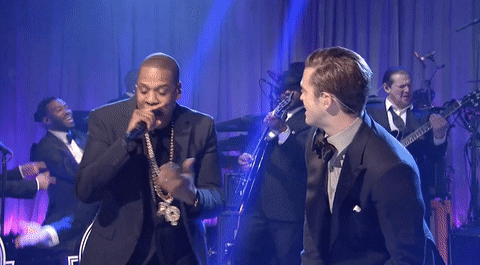

## Motivation
The music industry across the world is ever increasing and ever evolving. It is a medium of creating entertainment or expressing human emotions. Different artists have their own styles and quite often artists are seen to collaborate with each other by taking the best of both worlds. The type of music produced may either be more aligned to one of their styles or lie somewhere in between giving birth to a new kind of music. \
This study aims to understand the network topology of the music industry. The existence of assortativity was examined and emerged communities were further analysed to understand the collaborative music vs the solo music and the choice of collaboration that artists make ( is it based on their type of music, their popularity or both). Some hypotheses are tested basis the available data and conclusions are drawn.
## Network definition
A non-directional weighted network is created with each node representing an artist. An edge connects two artists when they have been credited with the same song. Node attributes are genre tags, follower count on Spotify and [popularity index](https://developer.spotify.com/documentation/web-api/reference/#/operations/get-an-artist) as defined by Spotify. Count of shared songs is defined as the "weight" attribute for the edges.
## Data Sources
The list of artists is obtained by scraping the hyperlinks present in the wiki page of [list of musicians](https://en.wikipedia.org/wiki/Lists_of_musicians). The musicians listed within each page were compiled into one big list. These artist names were searched in the Spotify database through the [Spotipy API](https://spotipy.readthedocs.io/en/2.21.0/) and all the albums and songs were extracted pertaining to those artists. The lyrics of the songs were obtained from [Lyrics genius API](https://genius.com/) via their API.\
<b>Note:</b> All the data extraction from the web APIs are performed in another notebook. This notebook contains the detailed analysis of the artist collaboration network  
    
## Loading Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as patches
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D
import networkx as nx
import time
import spotipy
import sys
from spotipy.oauth2 import SpotifyClientCredentials
import spotipy.util as util
import community
import nltk
import wordcloud
from nltk.probability import FreqDist
import warnings
warnings.filterwarnings('ignore')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

## Importing artist and track information
In order to create the network, the artist level information is loaded which contains artist's name, genre tags, follower counts and popularity index. These shall be the nodes of the network. Additionally, the track details are loaded which include the track name, and the participating artists. A track may be performed by a solo artist or in collaboration.

In [2]:
'''
-Artist level dataset having artist name, followers, popularity information
-Cleanup and type conversions of some fields are performed as appropriate.
-DJs are excluded from the analysis as they mix songs made by others and therefore may be a misfit in this analysis
'''
artist_dm = pd.read_csv("artist_dm_df.csv")
artist_dm['genres'] = artist_dm['genres'].str.replace("[","")
artist_dm['genres'] = artist_dm['genres'].str.replace("]","")
artist_dm['genres'] = artist_dm['genres'].str.replace("'","")
artist_dm = artist_dm[artist_dm['genres'].str.len()>=2]
artist_dm = artist_dm[~artist_dm['ArtistName'].str.contains("DJ ")] #dropping DJs
artist_dm = artist_dm.drop_duplicates('ArtistName')
artist_dm = artist_dm.reset_index()
artist_dm.drop(columns=['index','Unnamed: 0'],inplace=True)
print("Count of artists:  {:,}".format(len(artist_dm)))
artist_dm.head(n=2)

Count of artists:  23,392


,Unnamed: 0.1,ArtistName,id,genres,followers,popularity
0,0,Matt Nathanson,4NGiEU3Pkd8ASRyQR30jcA,"acoustic pop, neo mellow, pop rock",360372,54
1,1,Matthew Sweet,2idymNTKUdnTxforkb12Mw,"alternative country, alternative pop, alternat...",63639,39


In [3]:
'''
- Track data at track id and artist id level
- A track with various artists will have multiple rows
'''
artist_album_tracks_df = pd.read_csv("artist_album_tracks_df.csv")
artist_album_tracks_df.drop(columns=['Unnamed: 0'],inplace=True)
print("Track and artist combinations: {:,}".format(len(artist_album_tracks_df)))
artist_album_tracks_df.head(n=2)

Track and artist combinations: 1,918,309


,AlbumID,TrackID,TrackName,ArtistName,ArtistID
0,3Eiafb9pwTkgnOxjRz3QVb,64ymwIGgOLjM1ckgnOcBUX,German Cars,Matt Nathanson,4NGiEU3Pkd8ASRyQR30jcA
1,3Eiafb9pwTkgnOxjRz3QVb,7e8UMxG50XQJR9sRArHPt3,Pictures,Matt Nathanson,4NGiEU3Pkd8ASRyQR30jcA


The collaborations are identified by retaining tracks that are credited to more than one artist. Data is then rolled up at artist pair level and the count of the number of tracks they collaborated on , is maintained.

In [4]:
'''
-Self join is performed on the tracks data by TrackID
-Artists credited on the same track were joined and all permutations of the artists collaborating on a track is created
-Dropping track entries without an artist
'''
artist_album_tracks_df = artist_album_tracks_df[artist_album_tracks_df['ArtistName'].notnull()] 
tracks_multiple_artists_df = pd.DataFrame(artist_album_tracks_df['TrackID'].value_counts())
tracks_multiple_artists_df = tracks_multiple_artists_df.reset_index()
tracks_multiple_artists_df.rename(columns={'TrackID':'CountOfArtists','index':'TrackID'},inplace=True)
tracks_multiple_artists_df = tracks_multiple_artists_df[tracks_multiple_artists_df['CountOfArtists'] > 1]

#keeping only those tracks that are identified to have more than one artist credited
artist_album_tracks_subset_df = artist_album_tracks_df.merge(tracks_multiple_artists_df,how='inner',
                                                            left_on='TrackID',right_on='TrackID')
#self join on Track ID
artist_album_tracks_selfjoin_df = artist_album_tracks_subset_df.merge(artist_album_tracks_subset_df,how='inner',
                                                                     left_on='TrackID',right_on='TrackID')
artist_album_tracks_selfjoin_df=artist_album_tracks_selfjoin_df[['ArtistName_x','ArtistName_y','TrackID']]
artist_album_tracks_selfjoin_df = artist_album_tracks_selfjoin_df[artist_album_tracks_selfjoin_df['ArtistName_x'] != artist_album_tracks_selfjoin_df['ArtistName_y']]
artist_album_tracks_selfjoin_df= artist_album_tracks_selfjoin_df.reset_index()
artist_album_tracks_selfjoin_df.drop(columns=['index'],inplace=True)

# count of shared songs for edge weight attribute
artist_pair_song_count = pd.DataFrame(artist_album_tracks_selfjoin_df.groupby(['ArtistName_x','ArtistName_y']).count())
artist_pair_song_count = artist_pair_song_count.reset_index()
artist_pair_song_count.rename(columns={'TrackID':'CountOfSongs'},inplace=True)
artist_pair_song_count= artist_pair_song_count.merge(artist_dm[['ArtistName','genres','followers','popularity']],how='left',
                                                     left_on='ArtistName_x',right_on='ArtistName')
'''
Preparing the input data for graph creation
- node attributes: followers_x, followers_y, genres_x, genres_y, popularity_x, popularity_y
- edge weight attribute: CountofSongs
'''
artist_pair_song_count.rename(columns={'genres':'genres_x','followers': 'followers_x','popularity': 'popularity_x'},inplace=True)
artist_pair_song_count.drop(columns=['ArtistName'],inplace=True)
artist_pair_song_count= artist_pair_song_count.merge(artist_dm[['ArtistName','genres','followers','popularity']],how='left',
                                                     left_on='ArtistName_y',right_on='ArtistName')
artist_pair_song_count.rename(columns={'genres':'genres_y','followers': 'followers_y','popularity': 'popularity_y'},inplace=True)
artist_pair_song_count.drop(columns=['ArtistName'],inplace=True)

artist_pair_song_count = artist_pair_song_count[(artist_pair_song_count['genres_x'].notnull()) & (artist_pair_song_count['genres_y'].notnull())]
artist_pair_song_count.reset_index(inplace=True)
artist_pair_song_count.drop(columns = ['index'],inplace=True)
print("Count of permutations:  {:,}".format(len(artist_pair_song_count)))
artist_pair_song_count.head(n=2)

Count of permutations:  133,210


,ArtistName_x,ArtistName_y,CountOfSongs,genres_x,followers_x,popularity_x,genres_y,followers_y,popularity_y
0,"""Weird Al"" Yankovic",MC Lars,1,"comedy rock, comic, parody",695045.0,58.0,"comic, nerdcore",29533.0,32.0
1,"""Weird Al"" Yankovic",The Simpsons,1,"comedy rock, comic, parody",695045.0,58.0,"comic, novelty",31152.0,36.0


## Creating the network 
It is time to create the network. All artists are added as nodes. Additionally, genre tags, popularity index and follower counts are added as node attributes that will be later used for various analyses. An edge is created between two nodes when they have collaborated on a song. Each edge is associated with a edge weight i.e. count of songs. Once the network is created, the biggest component is extracted for visualisation.

In [5]:
G =nx.Graph()
'''adding nodes'''
for i in range(len(artist_pair_song_count)):
    G.add_node(artist_pair_song_count.loc[i,'ArtistName_x'], genre=artist_pair_song_count.loc[i,'genres_x'],
               followers=artist_pair_song_count.loc[i,'followers_x'],
              popularity=artist_pair_song_count.loc[i,'popularity_x'])
    G.add_node(artist_pair_song_count.loc[i,'ArtistName_y'], genre=artist_pair_song_count.loc[i,'genres_y'],
               followers=artist_pair_song_count.loc[i,'followers_y'],
               popularity=artist_pair_song_count.loc[i,'popularity_y'])
    
    
for i in range(len(artist_pair_song_count)):
    G.add_edge(artist_pair_song_count.loc[i,'ArtistName_x'],artist_pair_song_count.loc[i,'ArtistName_y'],
              weight = artist_pair_song_count.loc[i,'CountOfSongs']/2) #to adjust for duplicates

print("Number of nodes: {:,}".format(G.number_of_nodes()))
print("Number of edges: {:,}".format(G.number_of_edges()))
print("The number of edges is almost half as networkx takes care of the duplicate combinations. This is why the count of songs is halved")

biggest_comps = max(nx.connected_components(G),key=len)
G_1 = G.subgraph(biggest_comps).copy()
print("Nodes:: G_1 {:,}".format(G_1.number_of_nodes()))
print("Edges:: G_1 {:,}".format(G_1.number_of_edges()))
print("Average degree: ",np.round(G_1.number_of_edges()/G_1.number_of_nodes(),3))

Number of nodes: 19,383
Number of edges: 66,605
The number of edges is almost half as networkx takes care of the duplicate combinations. This is why the count of songs is halved
Nodes:: G_1 18,031
Edges:: G_1 65,615
Average degree:  3.639


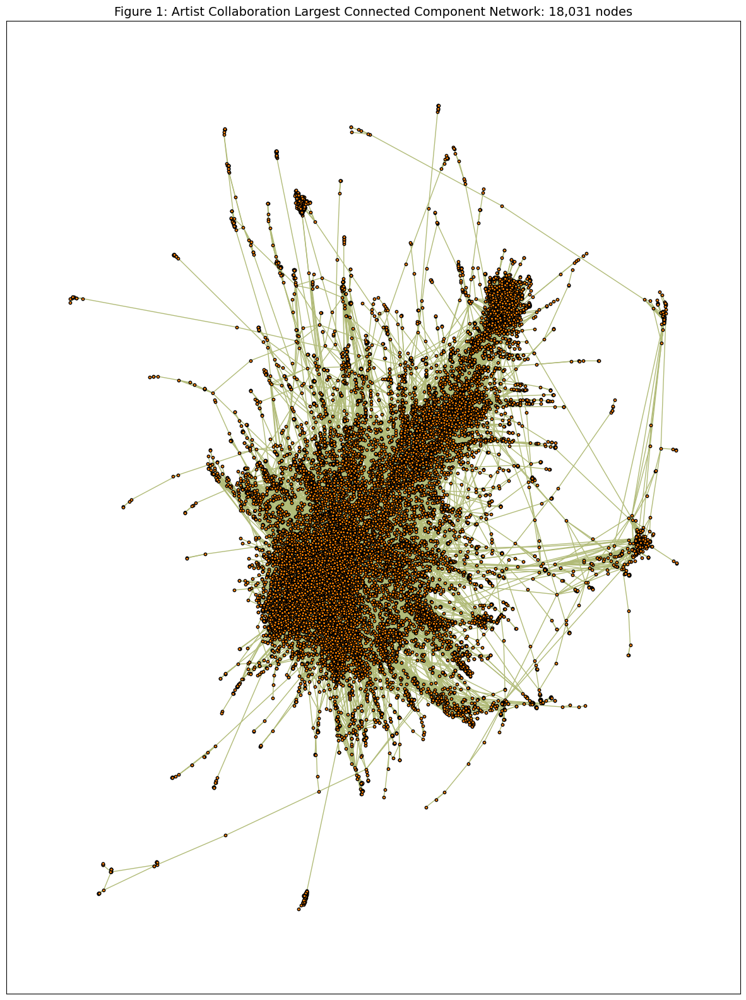

In [7]:
from fa2 import ForceAtlas2
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        linLogMode=False,
                        adjustSizes=False,
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=False,
                        multiThreaded=False,

                        # Tuning
                        scalingRatio=0.01,
                        strongGravityMode=True,
                        gravity=5,

                        # Log
                        verbose=True)
    
positions_G1 = forceatlas2.forceatlas2_networkx_layout(G_1, pos=None, iterations=2000)
plt.figure(figsize=(15, 20))
nx.draw_networkx_nodes(G_1, positions_G1, node_color='#FF8300', node_size=10,edgecolors='black')
nx.draw_networkx_edges(G_1, positions_G1, edge_color="#b1bb78")

plt.savefig('Figure0_ArtistCollaborationNetwork.png', dpi=500)
plt.title("Figure 1: Artist Collaboration Largest Connected Component Network: {:,} nodes".format(G_1.number_of_nodes()),fontsize= 14)
plt.show()

From *Figure 1* It can be seen that network is fairly big and almost resembles a dragonfly; it's head being a combination of one or more very big clusters. The ends of its wings or legs have smaller subnetworks which are loosely connected to the torso (probably owing to smaller edge weights).Given the size of the network, it would be difficult to analyse given the system resources. Therefore, the network was sampled using the [backbone algorithm](https://www.pnas.org/doi/epdf/10.1073/pnas.0808904106). This algorithm retains any connections that deviate from the [null model](https://en.wikipedia.org/wiki/Null_model) i.e. it captures the connections that deviate from a random structure. The disparity filter is used to identify the links whose $\alpha_{ij}$ < $\alpha$ and therefore reject the null hypothesis and are considered deviations from the null model. The sampled model is then visualised below.

original: nodes = 19,383, edges = 66,605
alpha = 0.05
backbone: nodes = 3,048, edges = 3,210


100%|██████████████████████████████████████████████████████████████████████████████| 2000/2000 [02:58<00:00, 11.21it/s]


Repulsion forces  took  167.10  seconds
Gravitational forces  took  0.13  seconds
Attraction forces  took  0.59  seconds
AdjustSpeedAndApplyForces step  took  5.48  seconds


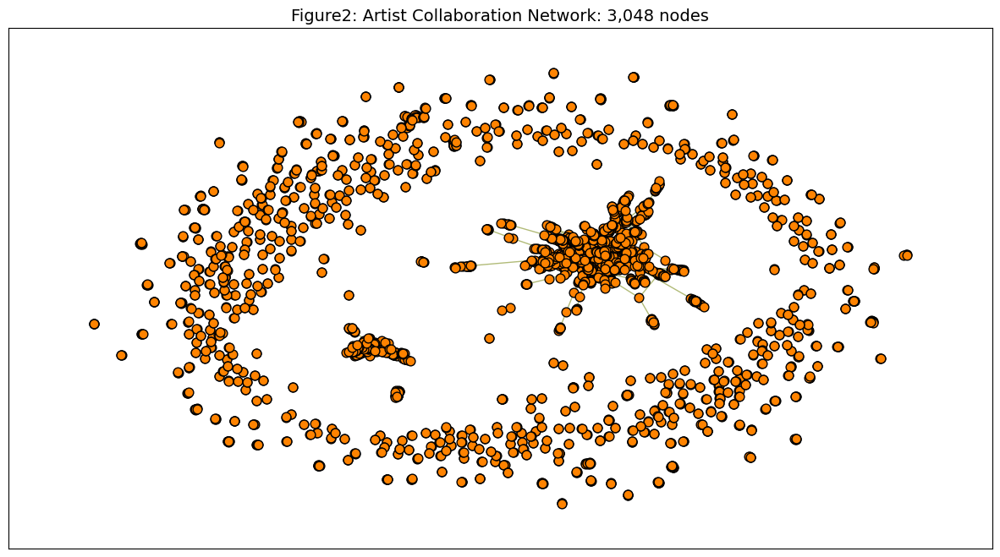

In [6]:
'''
This module implements the disparity filter to compute a significance score of edge weights in networks
'''

import networkx as nx
import numpy as np
from scipy import integrate


def disparity_filter(G, weight='weight'):
    ''' Compute significance scores (alpha) for weighted edges in G as defined in Serrano et al. 2009
        Args
            G: Weighted NetworkX graph
        Returns
            Weighted graph with a significance score (alpha) assigned to each edge
        References
            M. A. Serrano et al. (2009) Extracting the Multiscale backbone of complex weighted networks. PNAS, 106:16, pp. 6483-6488.
    '''
    
    if nx.is_directed(G): #directed case    
        N = nx.DiGraph()
        for u in G:
            
            k_out = G.out_degree(u)
            k_in = G.in_degree(u)
            
            if k_out > 1:
                sum_w_out = sum(np.absolute(G[u][v][weight]) for v in G.successors(u))
                for v in G.successors(u):
                    w = G[u][v][weight]
                    p_ij_out = float(np.absolute(w))/sum_w_out
                    alpha_ij_out = 1 - (k_out-1) * integrate.quad(lambda x: (1-x)**(k_out-2), 0, p_ij_out)[0]
                    N.add_edge(u, v, weight = w, alpha_out=float('%.4f' % alpha_ij_out))
                    
            elif k_out == 1 and G.in_degree(G.successors(u)[0]) == 1:
                #we need to keep the connection as it is the only way to maintain the connectivity of the network
                v = G.successors(u)[0]
                w = G[u][v][weight]
                N.add_edge(u, v, weight = w, alpha_out=0., alpha_in=0.)
                #there is no need to do the same for the k_in, since the link is built already from the tail
            
            if k_in > 1:
                sum_w_in = sum(np.absolute(G[v][u][weight]) for v in G.predecessors(u))
                for v in G.predecessors(u):
                    w = G[v][u][weight]
                    p_ij_in = float(np.absolute(w))/sum_w_in
                    alpha_ij_in = 1 - (k_in-1) * integrate.quad(lambda x: (1-x)**(k_in-2), 0, p_ij_in)[0]
                    N.add_edge(v, u, weight = w, alpha_in=float('%.4f' % alpha_ij_in))
        return N
    
    else: #undirected case
        B = nx.Graph()
        for u in G:
            k = len(G[u])
            if k > 1:
                sum_w = sum(np.absolute(G[u][v][weight]) for v in G[u])
                for v in G[u]:
                    w = G[u][v][weight]
                    p_ij = float(np.absolute(w))/sum_w
                    alpha_ij = 1 - (k-1) * integrate.quad(lambda x: (1-x)**(k-2), 0, p_ij)[0]
                    B.add_edge(u, v, weight = w, alpha=float('%.4f' % alpha_ij))
        return B

def disparity_filter_alpha_cut(G,weight='weight',alpha_t=0.4, cut_mode='or'):
    ''' Performs a cut of the graph previously filtered through the disparity_filter function.
        
        Args
        ----
        G: Weighted NetworkX graph
        
        weight: string (default='weight')
            Key for edge data used as the edge weight w_ij.
            
        alpha_t: double (default='0.4')
            The threshold for the alpha parameter that is used to select the surviving edges.
            It has to be a number between 0 and 1.
            
        cut_mode: string (default='or')
            Possible strings: 'or', 'and'.
            It works only for directed graphs. It represents the logic operation to filter out edges
            that do not pass the threshold value, combining the alpha_in and alpha_out attributes
            resulting from the disparity_filter function.
            
            
        Returns
        -------
        B: Weighted NetworkX graph
            The resulting graph contains only edges that survived from the filtering with the alpha_t threshold
    
        References
        ---------
        .. M. A. Serrano et al. (2009) Extracting the Multiscale backbone of complex weighted networks. PNAS, 106:16, pp. 6483-6488.
    '''    
    
    
    if nx.is_directed(G):#Directed case:   
        B = nx.DiGraph()
        for u, v, w in G.edges(data=True):
            try:
                alpha_in =  w['alpha_in']
            except KeyError: #there is no alpha_in, so we assign 1. It will never pass the cut
                alpha_in = 1
            try:
                alpha_out =  w['alpha_out']
            except KeyError: #there is no alpha_out, so we assign 1. It will never pass the cut
                alpha_out = 1  
            
            if cut_mode == 'or':
                if alpha_in<alpha_t or alpha_out<alpha_t:
                    B.add_edge(u,v, weight=w[weight])
            elif cut_mode == 'and':
                if alpha_in<alpha_t and alpha_out<alpha_t:
                    B.add_edge(u,v, weight=w[weight])
        return B

    else:
        B = nx.Graph()#Undirected case:   
        for u, v, w in G.edges(data=True):
            
            try:
                alpha = w['alpha']
            except KeyError: #there is no alpha, so we assign 1. It will never pass the cut
                alpha = 1
                
            if alpha<alpha_t:
                B.add_edge(u,v, weight=w[weight])
        return B                

alpha = 0.05
print("original: nodes = {:,}, edges = {:,}".format(G.number_of_nodes(), G.number_of_edges()))
G = disparity_filter(G)

G2 = nx.Graph([(u, v, d) for u, v, d in G.edges(data=True) if d['alpha'] < alpha])
print("alpha = {}".format(alpha))

print('backbone: nodes = {:,}, edges = {:,}'.format(G2.number_of_nodes(), G2.number_of_edges()))
# print(G2.edges(data=True))

from fa2 import ForceAtlas2
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        linLogMode=False,
                        adjustSizes=False,
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=False,
                        multiThreaded=False,

                        # Tuning
                        scalingRatio=0.01,
                        strongGravityMode=True,
                        gravity=5,

                        # Log
                        verbose=True)


positions = forceatlas2.forceatlas2_networkx_layout(G2, pos=None, iterations=2000)
plt.figure(figsize=(15, 8))
nx.draw_networkx_nodes(G2, positions, node_color='#FF8300', node_size=60,edgecolors='black')
nx.draw_networkx_edges(G2, positions, edge_color="#b1bb78")
plt.savefig('Figure2_ArtistCollaborationNetwork.png', dpi=500)
plt.title("Figure2: Artist Collaboration Network: {:,} nodes".format(G2.number_of_nodes()),fontsize= 14)
plt.show()


From Figure 2, it can be seen that there are multiple components (atleast three are visible to the eye).In order to understand them, the top three components by size were visualised and the word clouds of their genres were created.

Nodes:: G2_1: 76 G2_2: 357 G2_3 1,068
Edges:: G2_1: 91 G2_2: 580 G2_3 1,507


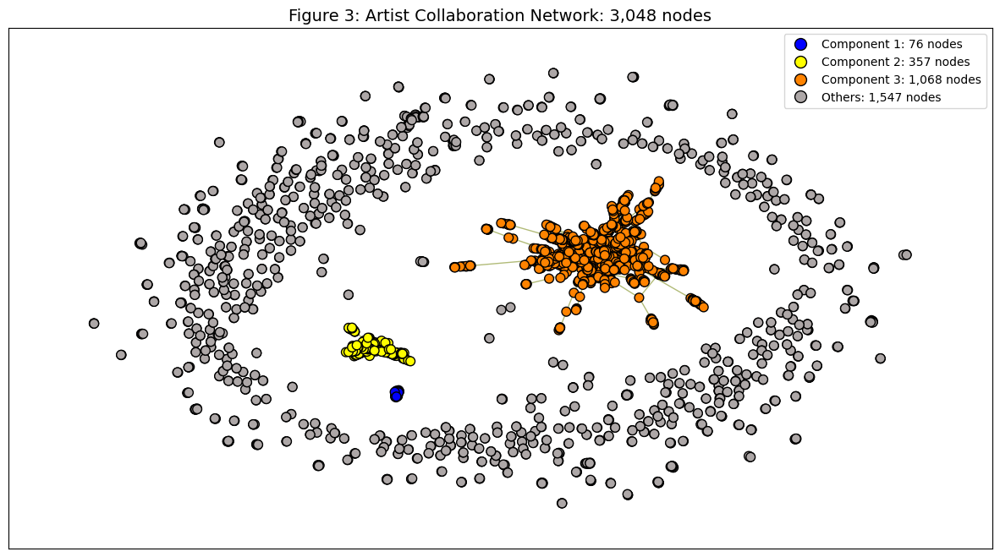

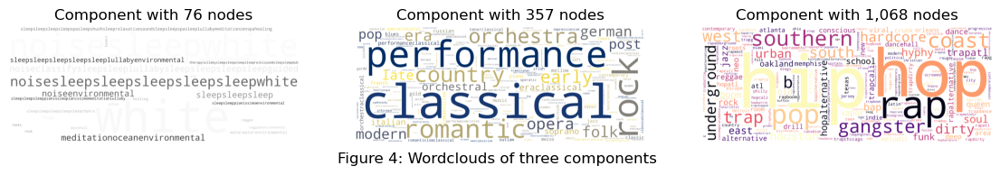

In [7]:
'''
Following code extracts the top 3 subgraphs from the sampled graph and assigns node colors to them.
Then sampled network is then visualised with necessary legends.
After the visualisation, the genres of each of the subgraphs is curated into lists and wordclouds are created based
on its frequencies.
'''
all_comps = nx.connected_components(G2)
big_components = []
for _all in all_comps:
# # there are 2 big and 1 sizeable network, extracting them
    if len(_all) >60:
        big_components.append(_all)
G2_1 = G2.subgraph(big_components[2]).copy()
G2_2 = G2.subgraph(big_components[1]).copy()
G2_3 = G2.subgraph(big_components[0]).copy()

print("Nodes:: G2_1: {:,} G2_2: {:,} G2_3 {:,}".format(G2_1.number_of_nodes(),G2_2.number_of_nodes(),G2_3.number_of_nodes()))
print("Edges:: G2_1: {:,} G2_2: {:,} G2_3 {:,}".format(G2_1.number_of_edges(),G2_2.number_of_edges(),G2_3.number_of_edges()))

G2_1_nodelist = [node for node in G2_1.nodes]
G2_2_nodelist = [node for node in G2_2.nodes]
G2_3_nodelist = [node for node in G2_3.nodes]
G2_nodelist = [node for node in G2.nodes]
node_color_map = []
'''assigning colors to the three components'''
for node in G2.nodes:
    if node in G2_1_nodelist:
        node_color_map.append('blue')
    elif node in G2_2_nodelist:
        node_color_map.append('yellow')
    elif node in G2_3_nodelist:
        node_color_map.append('#FF8300')
    else:
        node_color_map.append('#ADA7A7')
# print(len(node_color_map))

from fa2 import ForceAtlas2
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        linLogMode=False,
                        adjustSizes=False,
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=False,
                        multiThreaded=False,

                        # Tuning
                        scalingRatio=0.01,
                        strongGravityMode=True,
                        gravity=5,

                        # Log
                        verbose=True)


# positions = forceatlas2.forceatlas2_networkx_layout(G2, pos=None, iterations=2000)
plt.figure(figsize=(15, 8))
nx.draw_networkx_nodes(G2, positions, node_color=node_color_map, node_size=60,edgecolors='black')
nx.draw_networkx_edges(G2, positions, edge_color="#b1bb78")
# nx.draw_networkx_labels(G_subgraph, positions,, font_size=16, font_color="black")

#creating custom legend
legend_elements = [Line2D([0], [0], marker='o', markersize = 10,markeredgecolor='black',color = 'w',markerfacecolor="blue",label="Component 1: {:,} nodes".format(len(G2_1_nodelist))),
Line2D([0], [0], marker='o', markersize = 10,markeredgecolor='black',color = 'w',markerfacecolor="yellow",label="Component 2: {:,} nodes".format(len(G2_2_nodelist))),
                   Line2D([0], [0], marker='o',markersize = 10,markeredgecolor='black', color = 'w',markerfacecolor="#FF8300",label="Component 3: {:,} nodes".format(len(G2_3_nodelist))),
                  Line2D([0], [0], marker='o', markersize = 10,markeredgecolor='black',color = 'w',markerfacecolor="#ADA7A7",label="Others: {:,} nodes".format(len(G2_nodelist)-len(G2_1_nodelist)-len(G2_2_nodelist)-len(G2_3_nodelist)))]

plt.legend(handles=legend_elements, loc='upper right')

plt.savefig('Figure3_ArtistCollaborationNetwork.png', dpi=500)
plt.title("Figure 3: Artist Collaboration Network: {:,} nodes".format(G2.number_of_nodes()),fontsize= 14)
plt.show()

'''
Creating genre wordclouds of the top three components
'''
'''G2_1'''
edge_list = pd.DataFrame([n for n in G2_1.edges()],columns=['ArtistName_x','ArtistName_y'])
edge_list = edge_list.merge(artist_pair_song_count,how='left',left_on = ['ArtistName_x','ArtistName_y'],
                            right_on = ['ArtistName_x','ArtistName_y'])
G2_1 =nx.Graph()
'''adding nodes'''
for i in range(len(edge_list)):
    G2_1.add_node(edge_list.loc[i,'ArtistName_x'], genre=edge_list.loc[i,'genres_x'],
               followers=edge_list.loc[i,'followers_x'],
              popularity=edge_list.loc[i,'popularity_x'])
    G2_1.add_node(edge_list.loc[i,'ArtistName_y'], genre=edge_list.loc[i,'genres_y'],
               followers=edge_list.loc[i,'followers_y'],
               popularity=edge_list.loc[i,'popularity_y'])
    
    
for i in range(len(edge_list)):
    G2_1.add_edge(edge_list.loc[i,'ArtistName_x'],edge_list.loc[i,'ArtistName_y'],
              weight = edge_list.loc[i,'CountOfSongs']/2)

'''G2_2'''
edge_list = pd.DataFrame([n for n in G2_2.edges()],columns=['ArtistName_x','ArtistName_y'])
edge_list = edge_list.merge(artist_pair_song_count,how='left',left_on = ['ArtistName_x','ArtistName_y'],
                            right_on = ['ArtistName_x','ArtistName_y'])

G2_2 =nx.Graph()
'''adding nodes'''
for i in range(len(edge_list)):
    G2_2.add_node(edge_list.loc[i,'ArtistName_x'], genre=edge_list.loc[i,'genres_x'],
               followers=edge_list.loc[i,'followers_x'],
              popularity=edge_list.loc[i,'popularity_x'])
    G2_2.add_node(edge_list.loc[i,'ArtistName_y'], genre=edge_list.loc[i,'genres_y'],
               followers=edge_list.loc[i,'followers_y'],
               popularity=edge_list.loc[i,'popularity_y'])
    
    
for i in range(len(edge_list)):
    G2_2.add_edge(edge_list.loc[i,'ArtistName_x'],edge_list.loc[i,'ArtistName_y'],
              weight = edge_list.loc[i,'CountOfSongs']/2)

'''G2_3'''

edge_list = pd.DataFrame([n for n in G2_3.edges()],columns=['ArtistName_x','ArtistName_y'])
edge_list = edge_list.merge(artist_pair_song_count,how='left',left_on = ['ArtistName_x','ArtistName_y'],
                            right_on = ['ArtistName_x','ArtistName_y'])
G2_3 =nx.Graph()
'''adding nodes'''
for i in range(len(edge_list)):
    G2_3.add_node(edge_list.loc[i,'ArtistName_x'], genre=edge_list.loc[i,'genres_x'],
               followers=edge_list.loc[i,'followers_x'],
              popularity=edge_list.loc[i,'popularity_x'])
    G2_3.add_node(edge_list.loc[i,'ArtistName_y'], genre=edge_list.loc[i,'genres_y'],
               followers=edge_list.loc[i,'followers_y'],
               popularity=edge_list.loc[i,'popularity_y'])
    
    
for i in range(len(edge_list)):
    G2_3.add_edge(edge_list.loc[i,'ArtistName_x'],edge_list.loc[i,'ArtistName_y'],
              weight = edge_list.loc[i,'CountOfSongs']/2)
    
from PIL import Image
fig,axs = plt.subplots(1,3,figsize= (14,6))
graphs_list = [G2_1, G2_2, G2_3]
color_list = ['Greys','cividis','magma']
title_list = [len(G2_1_nodelist),len(G2_2_nodelist),len(G2_3_nodelist)]
for j in range(len(graphs_list)):
    graph_attributes = pd.DataFrame.from_dict(dict(graphs_list[j].nodes(data=True)), orient='index') #taking node attributes into a dataframe
    graph_attributes.reset_index(inplace=True)
    graph_attributes
    graph_attributes.rename(columns = {'index':'ArtistName'},inplace=True)
    artist_genre_combo = []
    for i in range(len(graph_attributes)):
        sample_list = list(graph_attributes.loc[i,'genre'].split(","))
        for sample in sample_list:
            temp = [graph_attributes.loc[i,'ArtistName'],sample]
            artist_genre_combo.append(temp)
    artist_genre_combo_df = pd.DataFrame(artist_genre_combo,columns=['ArtistName','Genre'])
    artist_genre_combo_df = artist_genre_combo_df[~artist_genre_combo_df['Genre'].isin([' singer-songwriter','c86'])]
    artist_genre_combo_df.reset_index(inplace=True)
    artist_genre_combo_df.drop(columns=['index'],inplace=True)
    
    genre_str = ""
    for i in range(len(artist_genre_combo_df)):
            genre_str+=artist_genre_combo_df.loc[i,'Genre'] #aggregating the genres in a list for each graph


    fig_wordcloud =wordcloud.WordCloud(width = 5000, height = 2000,
                                       background_color='white', collocations=False,colormap = color_list[j])
    fig_wordcloud.generate(genre_str) #passing dict of token TFIDF per community
    axs[j].imshow(fig_wordcloud, interpolation='bilinear')
    axs[j].axis('off')
    axs[j].set_title("Component with {:,} nodes".format(title_list[j]),size=12)

plt.savefig('Figure3_ComponentWordclouds.png', dpi=500)
plt.figtext(0.51, 0.35, "Figure 4: Wordclouds of three components",ha="center", fontsize=12)
plt.show()



#### Graph summary
| **Network Description**             | **Number of nodes** | **Number of edges** | **Average degree** |
|-------------------------------------|---------------------|---------------------|--------------------|
| Super Network                       |              19,383 |              66,605 |               3.44 |
| Largest component in super network  |              18,031 |              65,615 |               3.64 |
| Backbone graph                      |               3,048 |               3,210 |               1.05 |
| Largest component in backbone graph |               1,068 |               1,507 |               1.41 |

**Figure 3** shows that the largest component has ~1000 nodes followed by 357 and 76 nodes respectively. It can be seen that the first subgraph consists of sleep/lullaby music, white/noise which is generally used for sleeping,relaxation or work concentration. The second component combines mostly performance based music/instrumentals/choirs with occasional collaborations with rock music. The third and largest component consists of genres that are lyrical. The third component is proceeded with for the rest of the analysis. \
As a next step, the degree distribution of the largest component thus obtained is compared with the degree distribution of the super network(before application of the backbone algorithm).
## Degree distribution: Super network va largest component

Calculating best minimal value for power law fit
**** G: Distribution comparison: Powerlaw Vs Lognormal****
R:  -1.296 p:  0.277
G:  fits alternative better than powerlaw with very low confidence
**** G: Distribution comparison: Powerlaw Vs Poisson(Exponential)
R:  3.482 p:  0.397
G:  fits powerlaw better than alternative with very low confidence
G: supercritical regime
Calculating best minimal value for power law fit
**** G2_3: Distribution comparison: Powerlaw Vs Lognormal****
R:  -0.004 p:  0.956
G2_3:  fits alternative better than powerlaw with very low confidence
**** G2_3: Distribution comparison: Powerlaw Vs Poisson(Exponential)****
R:  1.344 p:  0.437
G2_3:  fits powerlaw better than alternative with very low confidence


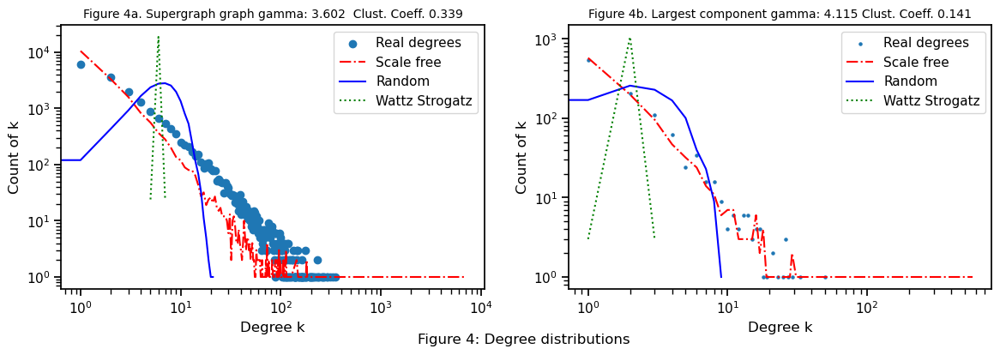

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context("notebook")
import powerlaw
import numpy as np
import colorama # for text color
from colorama import Fore 
'''
#Creating scale free graph with same number of degrees and nodes.Same code pattern as for the random graph
# random_degree_list, scale_degee_list = create_random_scale_free_graph(degree_of_artists)
'''
def fit_confidence_text(R,p):
    if (R > 0) & (p < 0.05):
        text = "fits powerlaw better than alternative with high confidence"
    elif (R > 0) & (p >= 0.05):
        text = "fits powerlaw better than alternative with very low confidence"
    elif (R < 0) & (p < 0.05):
        text = "fits alternative better than powerlaw with high confidence"
    else:
        text = "fits alternative better than powerlaw with very low confidence"
    return text

def degree_distribution_plot(degree_list):
    degrees_unique = np.unique(degree_list)
    degrees_unique_extd = np.append (degrees_unique, (max(degrees_unique)+1))
    counts, bins =np.histogram(degree_list, bins= degrees_unique_extd)
    return degrees_unique, counts

def create_random_scale_free_graph(degree_list):
    N= len(degree_list)
    k = np.sum(degree_list)/N
    p= k/(N-1)
    '''random - Erdos Renyi'''
    ER = nx.erdos_renyi_graph(N, p, seed=42, directed=False)
    random_degree_list= [ER.degree(node) for node in ER.nodes()]
    '''small world- Wattz Strogatz'''
    wattz_strogatz = nx.watts_strogatz_graph(N, int(np.round(k)), p)
    WS_degree_list= [wattz_strogatz.degree(node) for node in wattz_strogatz.nodes()]
    '''scale free'''
#     ScaleFreeGraph = nx.configuration_model(degree_list)
    ScaleFreeGraph = nx.scale_free_graph(N)
    scale_degree_list= [ScaleFreeGraph.degree(node) for node in ScaleFreeGraph.nodes()]
    return random_degree_list, WS_degree_list, scale_degree_list


    
fig,axs = plt.subplots(1,2,figsize=(14,4))
degree_of_artists = [d for n,d in G.degree()]
degrees_unique_real, counts_real = degree_distribution_plot(degree_of_artists)
# creating histogram inputs
random_degree_list, WS_degree_list, scale_degree_list = create_random_scale_free_graph(degree_of_artists)
degrees_scalefree, counts_scalefree = degree_distribution_plot(scale_degree_list)  
degrees_unique_random, counts_random = degree_distribution_plot(random_degree_list)
degrees_unique_WS, counts_WS = degree_distribution_plot(WS_degree_list)
powerlaw_fit = powerlaw.Fit(degree_of_artists, xmin=0, xmax=G.number_of_nodes())
print(Fore.BLUE + "**** G: Distribution comparison: Powerlaw Vs Lognormal****")
R, p = powerlaw_fit.distribution_compare('power_law', 'lognormal') # #statistical test to compare the distribution to powerlaw and lognormal
foot_text = fit_confidence_text(R,p)
print(Fore.BLACK + "R: ",np.round(R,3),"p: ",np.round(p,3))
print("G: ",foot_text)
print(Fore.BLUE + "**** G: Distribution comparison: Powerlaw Vs Poisson(Exponential)")
R, p = powerlaw_fit.distribution_compare('power_law', 'exponential') # #statistical test to compare the distribution to powerlaw and lognormal
foot_text = fit_confidence_text(R,p)
print(Fore.BLACK + "R: ",np.round(R,3),"p: ",np.round(p,3))
print("G: ",foot_text)
powerlaw_alfa = powerlaw_fit.alpha #slope

#**Regime of a network**
N= len(degree_of_artists)
k = np.mean(degree_of_artists)
# p= k/(N-1)
# k= p*(N-1)
if k > 1:
    print("G: supercritical regime")
else:
    print("G: subcritical regime")

#plotting the distributions, real and approximated, for comparison
axs[0].scatter(degrees_unique_real,counts_real,label="Real degrees")
axs[0].plot(degrees_scalefree,counts_scalefree,label="Scale free",color='r',linestyle = 'dashdot')
axs[0].plot(degrees_unique_random,counts_random,label="Random",color='blue')
axs[0].plot(degrees_unique_WS,counts_WS,label="Wattz Strogatz",color='green',linestyle='dotted')
axs[0].set_title('Figure 4a. Supergraph graph gamma: {}  Clust. Coeff. {}'.format(np.round(powerlaw_alfa,3),np.round(nx.average_clustering(G),3)),fontsize=10)
axs[0].set_xlabel("Degree k")
axs[0].set_xscale("log")
axs[0].set_ylabel("Count of k")
axs[0].set_yscale("log")
axs[0].legend()

degree_of_artists = [d for n,d in G2_3.degree()]
degrees_unique_real, counts_real = degree_distribution_plot(degree_of_artists)
random_degree_list, WS_degree_list, scale_degree_list = create_random_scale_free_graph(degree_of_artists)
# creating histogram inputs
degrees_scalefree, counts_scalefree = degree_distribution_plot(scale_degree_list)


degrees_unique_random, counts_random = degree_distribution_plot(random_degree_list)
degrees_unique_WS, counts_WS = degree_distribution_plot(WS_degree_list)   
powerlaw_fit = powerlaw.Fit(degree_of_artists, xmin=0, xmax=G2_3.number_of_nodes())
print(Fore.BLUE + "**** G2_3: Distribution comparison: Powerlaw Vs Lognormal****")
R, p = powerlaw_fit.distribution_compare('power_law', 'lognormal') # #statistical test to compare the distribution to powerlaw and lognormal
foot_text = fit_confidence_text(R,p)
print(Fore.BLACK +"R: ",np.round(R,3),"p: ",np.round(p,3))
print("G2_3: ",foot_text)

print(Fore.BLUE + "**** G2_3: Distribution comparison: Powerlaw Vs Poisson(Exponential)****")
R, p = powerlaw_fit.distribution_compare('power_law', 'exponential') # #statistical test to compare the distribution to powerlaw and lognormal
foot_text = fit_confidence_text(R,p)
print(Fore.BLACK + "R: ",np.round(R,3),"p: ",np.round(p,3))
print("G2_3: ",foot_text)

powerlaw_alfa = powerlaw_fit.alpha #slope

axs[1].scatter(degrees_unique_real,counts_real,label="Real degrees",s=5)
axs[1].plot(degrees_scalefree,counts_scalefree,label="Scale free",color='r',linestyle = 'dashdot')
axs[1].plot(degrees_unique_random,counts_random,label="Random",color='blue')
axs[1].plot(degrees_unique_WS,counts_WS,label="Wattz Strogatz",color='green',linestyle='dotted')
axs[1].set_title('Figure 4b. Largest component gamma: {} Clust. Coeff. {}'.format(np.round(powerlaw_alfa,3),np.round(nx.average_clustering(G2_3),3)),fontsize=10)
axs[1].set_xlabel("Degree k")
axs[1].set_xscale("log")
axs[1].set_ylabel("Count of k")
axs[1].set_yscale("log")
plt.figtext(0.51, -0.05, "Figure 4: Degree distributions",ha="center", fontsize=12)
axs[1].legend()


plt.savefig('Figure4_Degreedistributions.png', dpi=500)
plt.show()

Figure 4 shows the degree distribution of the super network and the backbone-sampled network. Additionally, scale free variant ( with the same number of nodes) and Random(Erdos-Renyi) network and the Wattz Strogatz degree distributions for similar network specifications have been plotted alongside the real network. It appears that the degree distribution of the network lies somewhere between that of a random network and a scale free network, in effect it is a heavy-tailed distribution. The $\gamma$ value >3 indicates that both the supernetwork and the largest component are outside the scale free regime. The network appears to be analogous to the [scientific collaboration network](https://www.pnas.org/doi/10.1073/pnas.98.2.404) as in both cases actual interactions between the nodes have been considered towards defining an edge. All real world networks are not scale free ( see [Anna et al.](https://www.nature.com/articles/s41467-019-08746-5#citeas) )
Upon running the powerlaw fit diagnostics , it is seen that the distribution fit is _Poisson(exponential) < lognormal < powerlaw_. Therefore the network has some some random as well as scale free characteristics. 
The inclination towards a random behavior for artist collaboration seems intuitive as the degree of a node is determined by the actual interaction between two artists that have collaborated on a song. There are finite possibilities to it than say, creation of an edge between two artists who have appeared on the same text or one artist following the other (in-degree distribution) where the possibilities may not be bounded. 
It is seen that the supernetwork is in the **supercritical regime** which means that a giant component exists in it that is similar to a network in itself. This is most likely the network of the lyrical genres that was identified. 
Next, the chosen component is visualised with labels of five most between characters \
An important characteristic of heavy tailed distribution is the manifestation of **Friendship Paradox** wherein a new incoming node has a higher chance of connecting with an existing node with very high degree than any other node( as opposed to the hypothesis of equal chance of connecting with any node). Presence of Friendship Paradox indicates that there are some influencers in the network. In this case, these artist-influencers may have a style of music which other artists would like to be part of. The test for friendship paradox is conducted for both the supernetwork and the largest component.

### Friendship Paradox

In [9]:
# defining a function for the friendship paradox test
from random import sample
def friendship(G):
    a= sample([node for node in G.nodes()],1)
    print(Fore.BLACK +"random node:", a)
    a_neighbors = [n for n in G.neighbors(a[0])]
    # pull the averages of a's neighbors
    degrees =[]
    for n in a_neighbors:
        degrees.append(G.degree(n))
    print(Fore.BLACK +"avg degree of a's neighbors: ",np.round(np.mean(degrees),2))
    print(Fore.BLACK +"degree of node a: ",G.degree(a[0]))
    if np.mean(degrees) > G.degree(a[0]):
        print("a's neighbors have more friends than a")
    else:
        print("a's neighbors have lesser friends than a")    

    print("doing this 1000 times...............")
    true_cnt = 0
    false_cnt = 0
    for i in range(1000):
        a= sample(list(G.nodes()),1)
        a_neighbors = [n for n in G.neighbors(a[0])]
        degrees =[]
        for n in a_neighbors:
            degrees.append(G.degree(n))
        if np.mean(degrees) > G.degree(a[0]):
            true_cnt +=1
        else:
            false_cnt +=1

    print(Fore.BLUE +"Number of times a's neighbors have more friends than a: ", true_cnt)
    print(Fore.BLUE +"Number of times a's neighbors have lesser friends than a: ", false_cnt)

# reusing the BA model generated in the previous section
friendship(G)
friendship(G2_3)

random node: ['Young Cash']
avg degree of a's neighbors:  153.2
degree of node a:  5
a's neighbors have more friends than a
doing this 1000 times...............
Number of times a's neighbors have more friends than a:  916
Number of times a's neighbors have lesser friends than a:  84
random node: ['Jean Carn']
avg degree of a's neighbors:  3.0
degree of node a:  1
a's neighbors have more friends than a
doing this 1000 times...............
Number of times a's neighbors have more friends than a:  872
Number of times a's neighbors have lesser friends than a:  128


It is seen that Friendship Paradox is seen to exist ~90% of the times in both cases , confirming the presence of influencers in the group. \
Following code visualises the largest component along with identifying the top 5 artists by betweenness centrality.

### Visualisation: Largest Component

100%|█████████████████████████████████████████████████████████████████████████████| 2000/2000 [00:09<00:00, 208.95it/s]


Repulsion forces  took  8.25  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.05  seconds
AdjustSpeedAndApplyForces step  took  0.75  seconds


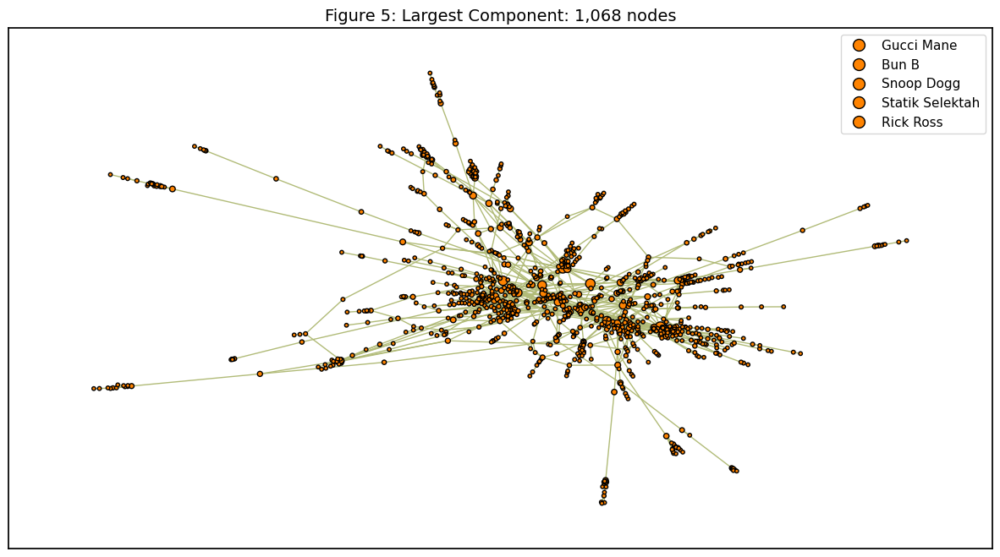

In [11]:
G2_3_between_cent = nx.betweenness_centrality(G2_3)
G2_3_between_cent_sorted = dict(sorted(G2_3_between_cent.items(), key=lambda item: item[1], reverse=True))
G_labels_betweenwise = {}
i= 0
top5 = []
for key,value in G2_3_between_cent_sorted.items():
    if i < 5:
        G_labels_betweenwise[key]=key
        top5.append(key)
    else:
        G_labels_betweenwise[key]=""
    i +=1

from fa2 import ForceAtlas2
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        linLogMode=False,
                        adjustSizes=False,
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=False,
                        multiThreaded=False,

                        # Tuning
                        scalingRatio=8, #0.01
                        strongGravityMode=True,
                        gravity=5,

                        # Log
                        verbose=True)



size_map = []
vmin = min(list(G2_3_between_cent.values()))
vmax = max(list(G2_3_between_cent.values()))
lower_lim = 10
upper_lim = 80
OldRange = (vmax - vmin)  
NewRange = (upper_lim - lower_lim)  
for degree in list(G2_3_between_cent.values()):
    NewValue = (((degree - vmin) * NewRange) / OldRange) + lower_lim
    size_map.append(NewValue)

color_map = []
for node in G2_3.nodes():
    if node in top5:
        color_map.append("magenta") #"#DF362D"
    else:
        color_map.append('#FF8300')
positions_G2_3 = forceatlas2.forceatlas2_networkx_layout(G2_3, pos=None, iterations=2000)
plt.figure(figsize=(15, 8))
nx.draw_networkx_nodes(G2_3, positions_G2_3, node_color='#FF8300', node_size=size_map,edgecolors='black') #FF8300
nx.draw_networkx_edges(G2_3, positions_G2_3, edge_color="#b1bb78")
legend_elements= []
for i in range(len(top5)):
    legend_elements.append(Line2D([0], [0], marker='o', color = 'w',markerfacecolor= "#FF8300",markeredgecolor='black',
                                  markersize = 10,label=top5[i]))

plt.legend(handles=legend_elements, loc='upper right')

plt.savefig('figure_5_largest_component.png', dpi=500)
plt.title("Figure 5: Largest Component: {:,} nodes".format(G2_3.number_of_nodes()),fontsize= 14)
plt.show()

Figure 3 shows the 5 artists with the highest betweenness. Snoop Dogg, Gucci Mane, Rick Ross, Bun B are all American rappers. Rap is the very collaborative genre [see](https://arxiv.org/pdf/physics/0511215.pdf) as rappers collaborate either with other fellow rappers or say, Pop singers for their choruses. The highest betweenness centrality for rappers is therefore understandable. \
In order to understand the network better, the relation between the different centrality measures and their relationship with the followers' count and popularity index from Spotify are studied. The [follower count](https://artists.spotify.com/en/help/article/listener-and-follower-data) indicates the number of users that "follow" (generally, subscribed) the artist's music and the popularity index [see 'popularity'](https://developer.spotify.com/documentation/web-api/reference/#/operations/get-an-artist). It would be interesting to see if the degree centrality measures have a direct variation with the popularity.

In [13]:
'''The node attributes present in the graph_attributes dataframe is exported into a csv to aid audio features and lyrics
extraction process. Refer to the Data Extraction Notebook for details'''

# graph_attributes.to_csv("graph_attributes_1068.csv")

'The node attributes present in the graph_attributes dataframe is exported into a csv to aid audio features and lyrics\nextraction process. Refer to the Data Extraction Notebook for details'

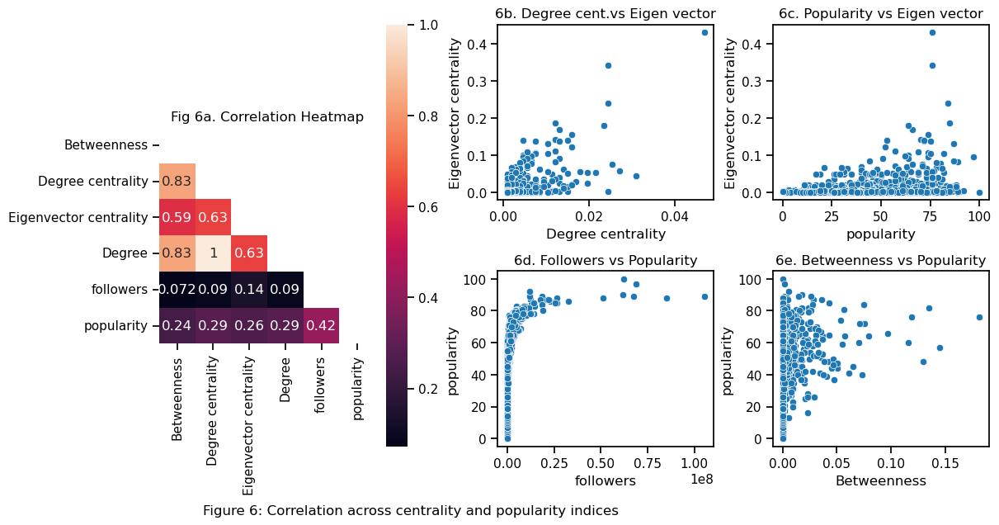

,ArtistName,Betweenness,Degree centrality,Eigenvector centrality,Degree,genres,followers,popularity
0,Lil Wyte,0.004414,0.003749,0.000453,4,"country rap, crunk, dirty south rap, gangster ...",577278,53
1,Jelly Roll,0.004495,0.003749,0.000481,4,"country rap, nashville hip hop, tennessee hip hop",1591976,70


In [11]:
degree_cent = nx.degree_centrality(G2_3)
between_cent = nx.betweenness_centrality(G2_3)
eigenvect_cent = nx.eigenvector_centrality(G2_3)
between_cent_df = pd.DataFrame.from_dict(between_cent,orient='index').rename(columns={0:'Betweenness'})
degree_cent_df = pd.DataFrame.from_dict(degree_cent,orient='index').rename(columns={0:'Degree centrality'})
eigenvect_cent_df = pd.DataFrame.from_dict(eigenvect_cent,orient='index').rename(columns={0:'Eigenvector centrality'})
centrality_df = between_cent_df.merge(degree_cent_df,how='left',left_index=True, right_index=True)
centrality_df = centrality_df.merge(eigenvect_cent_df,how='left',left_index=True, right_index=True)
centrality_df= centrality_df.reset_index()
degree_arr = []
for n , d in G2_3.degree():
    temp = [n,d]
    degree_arr.append(temp)
degree_arr_df = pd.DataFrame(degree_arr,columns=['index','Degree'])
centrality_df = centrality_df.merge(degree_arr_df,how='left',left_on="index",right_on='index')
centrality_df.rename(columns={'index':'ArtistName'},inplace=True)
centrality_df = centrality_df.merge(artist_dm[['ArtistName','genres','followers','popularity']],how='left',
                                    left_on = 'ArtistName',right_on='ArtistName')

corrMatrix = centrality_df[['Betweenness','Degree centrality','Eigenvector centrality','Degree','followers','popularity']].corr()
fig3 = plt.figure(constrained_layout=True,figsize=(12,6))
gs = fig3.add_gridspec(2, 3)
f3_ax1 = fig3.add_subplot(gs[:, 0])
f3_ax1.set_title('Fig 6a. Correlation Heatmap',loc='center')
# f3_ax1.set_title('(i) Correlation Heatmap',loc='left')
sns.axes_style("whitegrid")
mask = np.zeros_like(corrMatrix)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corrMatrix,mask = mask,annot=True, square=True,ax=f3_ax1)

f3_ax2 = fig3.add_subplot(gs[0,1])
f3_ax2.set_title('6b. Degree cent.vs Eigen vector')
# f3_ax2.set_title('(ii) Degree cent.vs Eigen vector')
sns.scatterplot(data=centrality_df, x='Degree centrality', y='Eigenvector centrality',palette=['##FF8300'],  ax=f3_ax2)


f3_ax4 = fig3.add_subplot(gs[0, 2])
f3_ax4.set_title('6c. Popularity vs Eigen vector')
# f3_ax4.set_title('(iii) Popularity vs Eigen vector')
sns.scatterplot(data=centrality_df, x='popularity', y='Eigenvector centrality',ax=f3_ax4)


f3_ax3 = fig3.add_subplot(gs[1, 1])
f3_ax3.set_title('6d. Followers vs Popularity')
# f3_ax3.set_title('(iv) Followers vs Popularity')
sns.scatterplot(data=centrality_df, x='followers', y='popularity',ax=f3_ax3)


f3_ax5 = fig3.add_subplot(gs[1, 2])
f3_ax5.set_title('6e. Betweenness vs Popularity')
# f3_ax5.set_title('(v) Betweenness vs Popularity')
sns.scatterplot(data=centrality_df, x='Betweenness', y='popularity',ax=f3_ax5)
plt.savefig('Figure6_HeatmapsnCorrelations.png', dpi=500)
plt.figtext(0.41,-0.03, "Figure 6: Correlation across centrality and popularity indices",ha="center", fontsize=12)
plt.show()
centrality_df.head(n=2)

**Figure 6a** shows a heatmap of the correlation across the measures. Figures 6b-e are scatter plots to look for any possible non-linear variation which may not be detectable by correlation.
Degree centrality and Eigen vector centrality(Fig 6b) have moderate correlation (0.63 per Fig 6a). It indicates that not all nodes that have high degree would also be "ranking" higher than others. Subsequent study of communities may reveal more.
Popularity and Eigen vector centrality dont seem to have any relation. Therefore, a higher collaboration ranking has little to do with popularity. This is understandable for the other genres genre but it takes considerable contemplation for Rap/Hip hop Genre as it thrives on collaborations. It could be explained by the phenomenon of many HipHop artists collaborating on one song; so they may not be hugely famous individually but the song might still do well (be more popular), or the lesser known rappers try to collaborate with as many rappers as they can but the more successful rappers keep their circle small.
A similar sentiment is echoed when comparing betweenness and popularity, a very high collaboration has little to do with popularity. Finally, unlike as it may seem, follower count and populairty measure arent correlated either as followers is an actual count of users who follow the artist on Spotify(assuming that synthetic increase of follower count makes up for a small proportion and doesnt affect the overall metric) and popularity is a calculated measure based on how often is an artist played. This may point towards a problem with reliability of the follower count (may have been increased synthetically).
Next, the **Louvain algorithm** is deployed to identify communities within the network.

{17: 98, 6: 81, 24: 79, 10: 60, 13: 58, 0: 54, 23: 46, 2: 42, 28: 41, 11: 40, 9: 36, 26: 33, 8: 32, 22: 31, 21: 30, 29: 29, 15: 27, 25: 27, 12: 23, 20: 22, 5: 19, 30: 19, 3: 17, 14: 16, 33: 16, 1: 15, 4: 14, 19: 13, 18: 10, 34: 10, 7: 9, 16: 7, 32: 5, 31: 5, 27: 4}


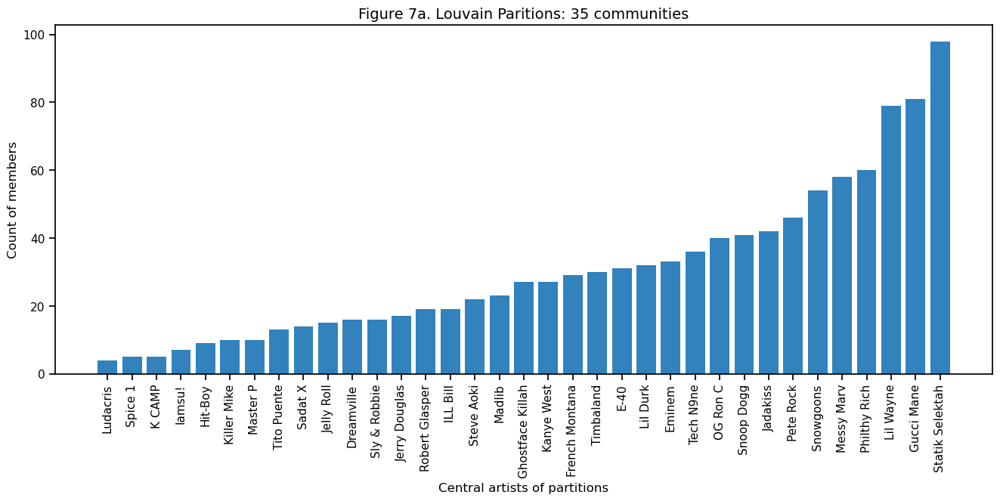

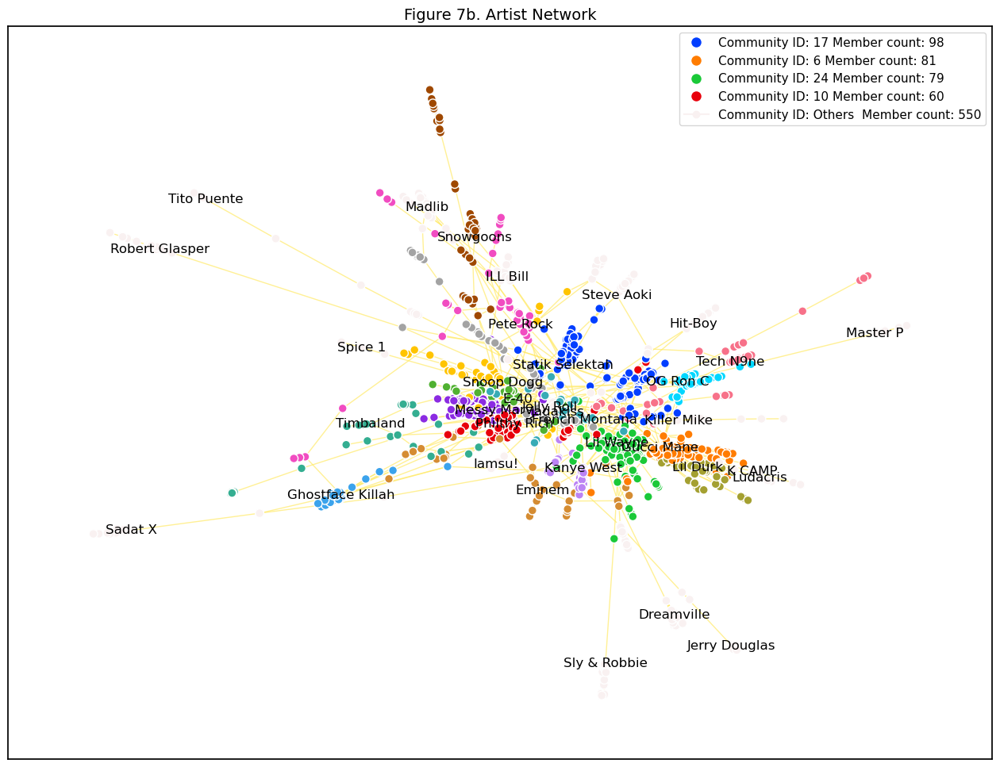

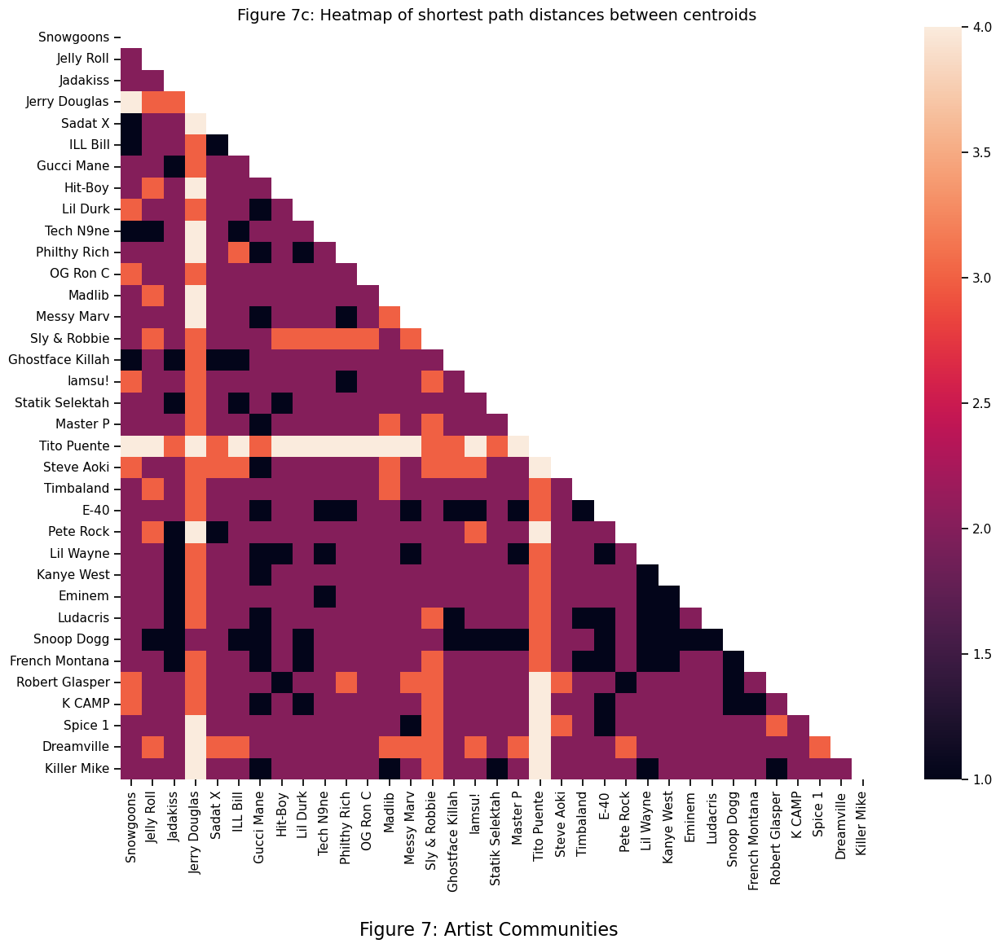

In [13]:
'''
Following code identifies the communities and undertakes data preparation for successive visualisations:
-Communities are identified and the output dictionary of artists and community mapping are extracted
-Node colors are identified for communities that are chosen to be color tagged
-Central figures are identified in each of the communities 
-Shortest distance between the centroids (central figures) of communities is calculated 
-
'''

'''
Making the artists communities using Louvain algorithm
'''
import community
import random
random.seed(42)
import nltk
from nltk.probability import FreqDist
def create_community(graphname):
    _partition = community.best_partition(graphname, weight='weight')
#     _partition = community.best_partition(graphname,random_state=42)
    _M = 0 #modularity
    L = len(graphname.edges())
    count= 0
    for com in set(_partition.values()) :
        count = count + 1
        list_nodes = [nodes for nodes in _partition.keys()
                                    if _partition[nodes] == com]
        temp_graph = "SG_"+str(com)
        temp_graph = graphname.subgraph(list_nodes)


        L_temp = len(temp_graph.edges())
        k_temp =  [val for (node, val) in temp_graph.degree()]
        k_temp = np.sum(k_temp)
        _M = _M +(L_temp/L) - ((k_temp/(2*L))**2)
    _count_of_partitions= len(set(_partition.values()))
    _partition_freq = FreqDist(_partition.values())
    _partition_freq2 = dict(sorted(_partition_freq.items(), key=lambda item: item[1]))
    return _M, _partition, _count_of_partitions, _partition_freq2

_M_artist, _partition_artists, _count_of_partitions_artists,_partition_freq = create_community(G2_3)
# _partition_freq
_partition_freq2_desc = dict(sorted(_partition_freq.items(), key=lambda item: item[1],reverse=True))
print(_partition_freq2_desc) #printing community and its size in descending order of size
_key_artists_desc = list(_partition_freq2_desc.keys())
_key_artists_desc = [str(a) for a in _key_artists_desc]
_value_artists_desc = list(_partition_freq2_desc.values())

'''Defining node colors for chosen communities
-Combining three color palletes and fetching colors from it in intervals based on the count of communities
-Top 18 communities are chosen by size to be color coded, rest are assigned a default color
'''

import seaborn as sns
def partition_colors(_partition,chosen_communities):
    aValue = sns.color_palette('bright').as_hex()[:]+sns.color_palette("husl", 9).as_hex()[:]+sns.color_palette("flare").as_hex()[:]+sns.color_palette("Set2").as_hex()[:] #listing out the colors in the pallete
    intervals = int(np.round((len(aValue)/len(chosen_communities)),0))-1 #interval determines how far apart should the colors be picked (to avoid similar colors getting picked)
    chosen_colors = [] #initializing chosen colors empty list
    i = 1
    while i <= len(chosen_communities):
        chosen_colors.append(aValue[(intervals*i)-1]) #picking the color at regular interval and appending to the list
        i+=1
    community_colors = dict(zip(chosen_communities, chosen_colors))#community and color dictionary
    chosen_colors_expanded = [] #initializing list where color is appended while iterating through the node list
    for module in _partition.values():
        if module in chosen_communities:
            chosen_colors_expanded.append(community_colors[module])#append color based on the community
        else:
            chosen_colors_expanded.append('#f9f1f1') #append default color for all other communities
    return chosen_colors_expanded, chosen_colors

_key_artists = list(_partition_freq.keys())
_key_artists = [str(a) for a in _key_artists]
_value_artists = list(_partition_freq.values())

chosen_communities = [int(comm) for comm in _key_artists_desc[:18]] #top 18 communities by size
#cast the community list as numeric
chosen_colors_expanded_artists,chosen_colors_artists = partition_colors(_partition_artists,chosen_communities)
edge_color = '#FFEA68'

partition_artists_df = pd.DataFrame.from_dict(_partition_artists,orient='index').reset_index().rename(columns={'index':'ArtistName',0:'CommunityID'})
partition_artists_df = partition_artists_df.merge(artist_dm[['ArtistName','genres']], how='left',
                                                           left_on='ArtistName',right_on='ArtistName')
#Tagging artist as NonRap genre if none of "Rap" and "Hip hop" appear in the genre tags
partition_artists_df['NonRapGenre'] = np.where(partition_artists_df['genres'].str.contains('rap|hip|hop'),0,1) 

'''Identifying the most central figures by degree centrality within each community for labelling'''
TopInTheirComm = []
for n in np.unique(partition_artists_df['CommunityID']):
    comm_subgraph_nodes= partition_artists_df[partition_artists_df['CommunityID']==n]['ArtistName']
    comm_subgraph = G2_3.subgraph(comm_subgraph_nodes)
    comm_subgraph_degree_cent = nx.degree_centrality(comm_subgraph)
    comm_subgraph_degree_cent_sorted = dict(sorted(comm_subgraph_degree_cent.items(), key=lambda item: item[1], reverse=True))
    temp= [n,list(comm_subgraph_degree_cent_sorted.items())[0][0]]
    TopInTheirComm.append(temp)
TopInTheirComm_df = pd.DataFrame(TopInTheirComm,columns=['CommunityID','ArtistName'])
TopInTheirComm_df

'''summarising community information at Community level such as median popularity, count of members and initializing
a placeholder for Dominant genre classification
'''
partition_artists_summarise = partition_artists_df.groupby('CommunityID').count()
partition_artists_summarise = partition_artists_summarise.reset_index()
partition_artists_summarise.drop(columns=['genres'],inplace=True)
partition_artists_summarise.rename(columns={'ArtistName': 'MemberCount'},inplace=True)
partition_artists_summarise = partition_artists_summarise.merge(TopInTheirComm_df,how='left',left_on='CommunityID',
                                                     right_on='CommunityID')
partition_artists_summarise.rename(columns={'ArtistName': 'CentralArtist'},inplace=True)
partition_artists_summarise['median_popularity'] = 0 #initializing field
partition_artists_summarise['TopGenre_hasNonHipHop'] = "" #initializing field
partition_artists_summarise.sort_values('MemberCount',inplace=True)

'''Bar plot of communities by their node count'''
plt.figure(figsize=(16,6))
plt.bar(partition_artists_summarise['CentralArtist'], partition_artists_summarise['MemberCount'],color= '#3182bd')
plt.xlabel("Central artists of partitions",fontsize=12)
plt.xticks(rotation=90)
plt.ylabel("Count of members")
plt.title("Figure 7a. Louvain Paritions: {} communities".format(len(_key_artists)),fontsize=14)
plt.show()

'''Labels for central figures'''
labels_TopInTheirCommunity = {}
for key,value in _partition_artists.items():
    if key in list(TopInTheirComm_df['ArtistName']):
        labels_TopInTheirCommunity[key] = key
    else:
        labels_TopInTheirCommunity[key]=""
# labels_TopInTheirCommunity

'''Plotting the graph'''

import matplotlib.patches as patches
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D
# plt.figure(figsize=(15, 6))
fig, ax = plt.subplots(figsize=(16, 12))
nx.draw_networkx_nodes(G2_3, positions_G2_3, node_size=60, node_color=chosen_colors_expanded_artists,
                       edgecolors='white',ax=ax)
nx.draw_networkx_edges(G2_3, positions_G2_3, edge_color="#FFEA68", alpha=0.7,ax=ax)
nx.draw_networkx_labels(G2_3,positions_G2_3, labels_TopInTheirCommunity, font_size=12, font_color="black")


'''Legend creation'''
legend_elements = [] 
for j in range(len(chosen_colors_artists[:4])):
    label_txt = "Community ID: "+str(chosen_communities[j])+" Member count: "+str(_partition_freq[chosen_communities[j]])
    legend_elements.append(Line2D([0], [0], marker='o', markersize=10,color = 'w',markerfacecolor=chosen_colors_artists[j],label=label_txt))
label_txt = "Community ID: Others  Member count: "+str(np.sum(_value_artists_desc[8:]))
legend_elements.append(Line2D([0], [0], marker='o', color='#f9f1f1',label=label_txt))

ax.legend(handles=legend_elements, loc='upper right')

plt.savefig('Figure7_artist_communtiies.png', dpi=300)
plt.title("Figure 7b. Artist Network",fontsize= 14)
plt.show()

'''Heat map of shortest distance between the centroids of different communities'''
prox = [ [0]*_count_of_partitions_artists for i in range(_count_of_partitions_artists)]
TopNames =list(TopInTheirComm_df['ArtistName'])
for i in range(len(TopNames)-1):
    for j in range(i+1,len(TopNames)):
        prox[i][j] = nx.shortest_path_length(G_1, source=TopNames[i],target = TopNames[j])
prox = np.asarray(prox)
prox = prox.T
plt.figure(figsize=(16,12))
mask = np.zeros_like(prox)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(prox, square=True,yticklabels=TopNames,xticklabels=TopNames,mask = mask)
plt.title("Figure 7c: Heatmap of shortest path distances between centroids",fontsize=14)
plt.figtext(0.45,-0.05, "Figure 7: Artist Communities",ha="center", fontsize=16)
plt.show()

In [124]:
print("Modularity value: ",np.round(_M_artist,3))

Modularity value:  0.81


**Figure 7a** shows the communities by size. The largest community is ~10% of the total nodes whereas the smallest community has 3 nodes. The three biggest communities are ~55% bigger than the next set of communities. The network has a very high modularity value of 0.81 which indicates homogenous partitions. A disadvantage of the Louvain algorithm is that it can sometimes create [disconnected communities](https://www.nature.com/articles/s41598-019-41695-z) which may be the reason of size of the big communities. This can be investigated in the next section where some of the sizeable communities are studied in detail.
Figure 7b shows the network graph now annotated with the top 8 communtities by their central figures(by degree centrality). Snoop Dogg, Eminem, Lil Wayne, Kanye West are some very popular artists who appear to be central in their respective communities. The collocation of their communities indicate that their communities might be closely related to one another. \
Figure 7c sheds more light on the distances between the communities by plotting the heatmap of the shortest distance between the centroids of the communities. It is seen that the community with central Figure `Tito Puente` is at a distance of ~4 from many communities such as that of `Robert Glasper`,`Master P`,`Pete Rock`,`Sadat X` etc as is also evident from the network visualisation. The community of Jerry Douglas is also quite isolated both per the visualisation and the heatmap. This could be explained by the fact that both Jerry Douglas and Tito Puente are fairly senior artists and were active at a different time and therefore their communities had little interaction with the newer generation of artists. On the other hand, `Lil Wayne`,`Gucci Mane` and `Yo Gotti` have very low path distances amongst themselves and they are seen collocated on the plot.  These artists are contemporaries and its is quite probable that they are one hop away from each other's communities.\
As a first step towards analysing the communities, the subgraphs were visualised using the Kamada Kawai layout and this was combined with the popularity and follower information. The relation between average degree and fan following was investigated as seen below.


35


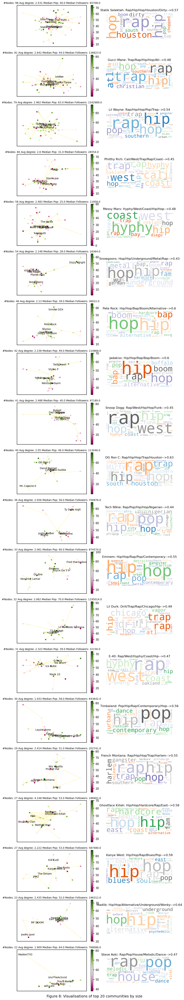

In [14]:
'''
Following code captures the genre tags respectively in each community and used to create TFIDF word clouds for top 20
communities by size. Kamada Kawai visualisations are used to show the subgraphs along with information such as 
median followers, popularity and community size.
'''
chosen_communities = [int(comm) for comm in _key_artists_desc[:20]]
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction import _stop_words # from sklearn
from nltk.corpus import stopwords  # from nltk
from spacy.lang.en.stop_words import STOP_WORDS #from spacy
import string
import wordcloud
from nltk import *
from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer,TfidfVectorizer

'''
Aggregating the genres at community level
INPUT: Community partition and genres
OUTPUT: Community wise genre corpus
'''
master_comm_genrenames = [] # Master list to store all the communities-wise texts
for i in range(len(pd.unique(partition_artists_df['CommunityID']))):
    temp = ""
    master_comm_genrenames.append(temp) #placeholder for each community
print(len(master_comm_genrenames))

for i in range(len(partition_artists_df)): #reading the lyrics
    value = partition_artists_df.loc[i,'CommunityID'] #capturing community ID of the artist
    genrenames = partition_artists_df.loc[i,'genres']
    temps = ""
    temps = str(master_comm_genrenames[value])
    
    temps= temps+" "+genrenames
    master_comm_genrenames[value] = temps

len(master_comm_genrenames)

'''
Creating TFIDF wordclouds given the corpus.
INPUT: Community wise genre, number of rows and columns in visualisation
OUTPUT: TFIDF vector, Kamada Kawai visualisations of subplots and their respective genre TFIDF wordclouds
The titles of Kamada Kawai plots show median popularity, followers and avg degree whereas the titles of the 
wordclouds show top 5 genres by their TFIDF scores. This would give a guidance towards the most relevant genres
present in the group by factoring in both uniqueness(IDF) and frequency(TF) of the genre tags
'''
def tfidf_wordcloud(master_comm, nrow,ncol,algo_name):
    vectorizer = TfidfVectorizer() #method used to create TFIDF values
    corpus = master_comm # full text corpus 
    vecs=vectorizer.fit_transform(corpus) # creating TFIDF matrix (row: community, column : token)
    feature_names =vectorizer.get_feature_names_out() #tokens
    df_tfidfvect = pd.DataFrame(data = vecs.toarray(),columns = feature_names) #creating dataframe
    df_tfidfvect_T = df_tfidfvect.T # each column is now one community
    df_tfidfvect_T = df_tfidfvect_T.reset_index() #getting the tokens as a column
    df_tfidfvect_T.rename(columns={'index':"token"},inplace=True)

    import matplotlib.cm
    fig,axs = plt.subplots(nrow,ncol,figsize=(11,70),gridspec_kw={'width_ratios': [1.3,1]})
    axs = axs.flatten()
    for z in range(len(chosen_communities)):
        node_list = [key for key,value in _partition_artists.items() if value ==chosen_communities[z]]
        temp_graph = G2_3.subgraph(node_list)
        node_attr = pd.DataFrame.from_dict(dict(temp_graph.nodes(data=True)), orient='index')
        degree_cent = nx.degree_centrality(temp_graph)
        degree_cent_sorted = dict(sorted(degree_cent.items(), key=lambda item: item[1], reverse=True))
        labels_degreewise = {}
        j= 0
        for key,value in degree_cent_sorted.items(): #labelling top five artists by centrality within the subgraphs
            if j < 5:
                labels_degreewise[key]=key.replace('$$','ss')
            else:
                labels_degreewise[key]=""
            j +=1
        pos_subgraph = nx.kamada_kawai_layout(temp_graph)
        vmin = min(list(node_attr['popularity']))
        vmax = max(list(node_attr['popularity']))
        gr = nx.draw_networkx_nodes(temp_graph, pos_subgraph, node_color=list(node_attr['popularity']), node_size=19, cmap='PiYG',ax=axs[2*z])
        gr = nx.draw_networkx_edges(temp_graph, pos_subgraph, edge_color="#FFEA68", alpha=0.7,ax=axs[2*z])
        gr = nx.draw_networkx_labels(temp_graph, pos_subgraph, labels_degreewise, font_size=10, font_color="black",ax=axs[2*z])
        sm = plt.cm.ScalarMappable(cmap='PiYG', norm=plt.Normalize(vmin = vmin, vmax=vmax))
        plt.colorbar(sm, ax=axs[2*z])

        node_count = temp_graph.number_of_nodes()
        avg_degree = np.round((sum(d for n, d in temp_graph.degree()) / float(temp_graph.number_of_nodes())),3)
        median_popularity=np.round(np.median(node_attr['popularity']))
        median_followers=np.round(np.median(node_attr['followers']))
        axs[2*z].set_title("#Nodes: {} Avg degree: {} Median Pop: {} Median Followers: {}".format(node_count, avg_degree,median_popularity,median_followers),fontsize=10)

        _num  =chosen_communities[z]
        if len(master_comm[_num]) >0 :
            #to get the top 5 words in the TF-IDF vector
            tf_idf_counter = dict(zip(df_tfidfvect_T['token'],df_tfidfvect_T[_num])) #dict of token TFIDF per community
            tf_idf_counter_sorted = dict(sorted(tf_idf_counter.items(), key=lambda item: item[1], reverse=True)) #sorting dictionary in desc order
            firstN = [n for n in tf_idf_counter_sorted.items()][:5] #top 5 words by TFIDF value for subplot title
            plot_header = TopInTheirComm_df[TopInTheirComm_df['CommunityID']==_num]['ArtistName'].values[0]+": "
            c = 0
            for key, value in firstN:
                if c == 0:
                    plot_header= plot_header+key.title()
                else:
                    plot_header= plot_header+"/"+key.title() #appending words separated by "/""
                c +=1
            # plot header to have top 5 words by TFIDF in the community followed by the Max TFIDF in that community
            plot_header = plot_header+"-->"+str(np.round(np.max(df_tfidfvect_T[_num]),2))
            #creating the wordclouds
            fig_wordcloud =wordcloud.WordCloud(width = 5000, height = 2000,
            background_color='white', collocations=False,
            colormap = 'tab20c')
            fig_wordcloud.generate_from_frequencies(tf_idf_counter) #passing dict of token TFIDF per community
            axs[2*z+1].imshow(fig_wordcloud, interpolation='bilinear')
            axs[2*z+1].axis('off')
            axs[2*z+1].set_title(plot_header,size=12)

    

    plt.subplots_adjust(wspace=0.025, hspace=None)
#     plt.tight_layout(pad=-1)
    plt.figtext(0.51, 0.105,"Figure 8: Visualisations of top 20 communities by size",ha="center", fontsize=14)
    plt.savefig('Figure8_subgraphs.png', dpi=500)
    plt.show()
    return df_tfidfvect_T


df_tfidfvect_T = tfidf_wordcloud(master_comm_genrenames, 20,2,'Louvain')

**Figure 8** captures the visualisation of top 20 communities by size. The average degree, median popularity and median followers are displayed along with the four artists with the highest degree within each subgraph. Every community visualisation is accompanied by a wordcloud of based on TFIDF values of the genres of these artists. Quite a few interesting observations are made here. A quick look through the top genres tags by their TFIDF shows that the Hip Hop/Rap or its variant( west coast rap, cali rap, southern hip hop, dirty south rap etc are only a few sub variants) appear in every wordcloud which corroborates that the rap/Hip hop genre is by far the most collaborative genre. 
Secondly, the biggest community(#node count: 98) has a considerable average degree of 3 but the follower and popularity figures are quite humble. This may be a community of rising or not-so popular artists who prefer to collaborate. The corresponding wordcloud on the right captures Rap and HipHop and Houston Rap, Dirty Rap which are nothing but sub-genres of Hip hop. It is worth noticing that the four central figures [Trae Tha Truth](https://en.wikipedia.org/wiki/Trae_tha_Truth), [Paul Wall](https://en.wikipedia.org/wiki/Paul_Wall), [Termanalogy](https://en.wikipedia.org/wiki/Termanology) [Slim Thug](https://en.wikipedia.org/wiki/Slim_Thug_) are rappers as well. Therefore, This community may be made of artists from the Rap community who collaborate to make music. \
As one goes further down into the plots, communities that have comparatively higher median popularity are relatively smaller and variants of pop ( urban contemporary, dance pop etc.) and rock (country rock as per the plot) begin to take center stage. An example could be the communities with central figures as Lil Wayne, Eminem, Timbaland, Kanye West. Although the central figure is from the rap community, the median popularity is higher as pop/rock artists also collaborate with them. Community led by Lil Durk seems to be an exception where the community seems to be rap-heavy and also has a high popularity index. It is difficult to see any trend with the followers count as they appear to be very random. The following plot summarizes the trend of community size and popularity in an effort to generalise the above observations.

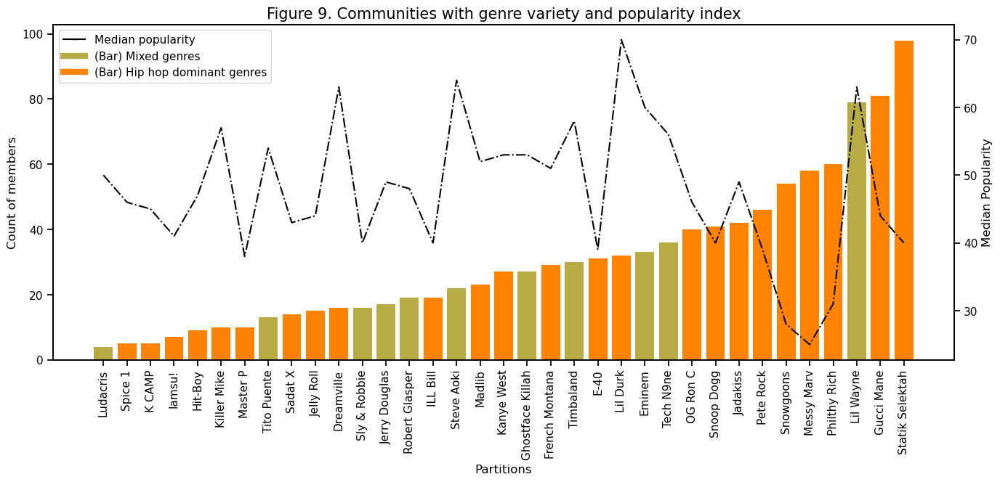

In [16]:
'''
Following code populates the partition_artists_summarise table with median popularity information.
It also segregates communities into mixed genre and Hip hop dominant communities depending on the presence (or absence)
of Non rap/Hip hop genres in the top 5 genre names by TFIDF values.
'''
import matplotlib.patches as mpatches
avg_degree_arr = []
popularity_arr = []
color_bar = []
for z in partition_artists_summarise['CommunityID']:
    z1=int(z)
    node_list = [key for key,value in _partition_artists.items() if value ==z1]
    temp_graph = G2_3.subgraph(node_list)
    node_attr = pd.DataFrame.from_dict(dict(temp_graph.nodes(data=True)), orient='index')
    node_count = temp_graph.number_of_nodes()

    avg_degree = np.round((sum(d for n, d in temp_graph.degree()) / float(temp_graph.number_of_nodes())),3)
    avg_degree_arr.append(avg_degree)
    median_popularity=np.round(np.median(node_attr['popularity']))
    partition_artists_summarise.loc[z1,'median_popularity']= median_popularity
    popularity_arr.append(median_popularity)
#     followers_arr.append(median_followers)

    if len(master_comm_genrenames[z1]) >0 :
    #to get the top 5 words in the TF-IDF vector
        tf_idf_counter = dict(zip(df_tfidfvect_T['token'],df_tfidfvect_T[z1])) #dict of token TFIDF per community
        tf_idf_counter_sorted = dict(sorted(tf_idf_counter.items(), key=lambda item: item[1], reverse=True)) #sorting dictionary in desc order
        firstN = [n for n in tf_idf_counter_sorted.items()][:5] #top 5 words by TFIDF value for subplot title
        plot_header = ""
        for key, value in firstN:
            plot_header= plot_header+" "+key.title()
        if (plot_header.find("Pop") >= 0 )|(plot_header.find("Rock") >= 0 ) | (plot_header.find("Contemporary") >= 0 ) | (plot_header.find("Jazz") >=0 | (plot_header.find("Dance") >= 0 ) | (plot_header.find("Vibe") >= 0 )| (plot_header.find("Country") >= 0 )):
            partition_artists_summarise.loc[z1,'TopGenre_hasNonHipHop'] = 'Y'
            color_bar.append("#B7AC44") #--Has none-Hip hop/Rap genres on top
        else:
            partition_artists_summarise.loc[z1,'TopGenre_hasNonHipHop'] = 'N'
            color_bar.append("#FF8300")#--Only has Hip hop/Rap genres on top

partition_artists_summarise.sort_values('MemberCount',ascending=True,inplace=True)
                                                                                                                          
'''Bar plot of communities by their node count'''
fig,ax = plt.subplots(figsize=(16,6))
ax2=ax.twinx()
ax.bar(partition_artists_summarise['CentralArtist'],partition_artists_summarise['MemberCount'],color=color_bar)
ax2.plot(partition_artists_summarise['CentralArtist'], partition_artists_summarise['median_popularity'], label='Median popularity', color= 'black', linestyle='dashdot')
ax.set_xlabel("Partitions")
ax.set_ylabel("Count of members")
ax2.set_ylabel("Median Popularity")
ax.tick_params(axis='x',labelrotation=90)
red_patch = mpatches.Patch(color='red', label='The red data')
legend_elements = [Line2D([0], [0], marker='_', color = 'black',markerfacecolor="black",label="Median popularity"),
                   Line2D([0], [0], lw=6,color = "#B7AC44",label="(Bar) Mixed genres"),
                   Line2D([0], [0], lw=6, color = "#FF8300",label="(Bar) Hip hop dominant genres")]
ax.legend(handles=legend_elements, loc='upper left')
plt.title("Figure 9. Communities with genre variety and popularity index".format(len(_key_artists)),fontsize=15)
plt.savefig('Figure9_Community_genre_popularity.png', dpi=500)
plt.show()


As seen in Figure 9 above, popularity seems to higher for smaller communities than the larger ones. Also, the communiies that have non Hip hop/ Rap genres also as top genres tend to have higher popularity. This also indicates that popular artists tend to collaborate amongst themselves as that probably guarantees more success on the music charts. \
The next step is to study the kind of music that is made by the artists in the communities,starting with the song lyrics. For this purpose, two source of songs were used viz., solo songs by the artists and songs performed in collaboration. Songs that were credited to more than one artist were tagged as solos and the others were tagged as collaborations (Code details are present in the Data Extraction notebook).
## Analysing lyrics of the artist collaborations
In order to analyse the nature of the collaborations of the artists within the communities, it is important to analyse only the tracks performed collaboratively by artists. The words chosen in the lyrics as well as the overall sentiment of the songs could reveal some interesting insights. The happiness scores are calculated based on three methodologies viz., 
- Happiness scores from [LabMT](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752#pone.0026752.s001) file
- [TextBlob](https://textblob.readthedocs.io/en/dev/) sentiment analyzer
- [NLTK Vader](https://www.nltk.org/_modules/nltk/sentiment/vader.html)  sentiment analyzer \
As a first step, files with lyrics of collaboration songs are loaded and non-english songs are dropped via a language detection function.

In [17]:
'''
Below code is used to import the collaboration tracks and sort tracks into the respective communities
- Any tracks that are credited to any artist outside the scope of the component being evaluated, is excluded
- This causes only tracks that are native to the community to remain
- Only collaborations that occured within the same community are kept(crossed community collaborations are dropped)
- Function is created to detect the language of the lyrics; anything other than english is excluded
'''

'''Function for language detection. Exception handling implemented should the module not be able to read the characters'''
from langdetect import detect, detect_langs
def language_detection(text, method = "single"):
    if(method.lower() != "single"):
        try:
            result = detect_langs(text)
        except:
            result = "na"
    else:
        try:
            result = detect(text)
        except:
            result = "na"
    return result

text1 = "despacito"
text2= "ティーな幸せ"
print("sample text1 language: ",language_detection(text1)) #testing the function with two languages
print("sample text2 language: ",language_detection(text2))

popularity_list_df = pd.read_csv("popularity_list_df.csv")
popularity_list_df.drop(columns=['Unnamed: 0'],inplace=True)
popularity_list_df.head()

collabsong_df= pd.read_csv("artist_collabsonglyrics_df.csv")
#identify tracks where artist is not from the sampled subgraph
collabsong_df_exclude = collabsong_df[~collabsong_df['ArtistName'].isin(list(partition_artists_df['ArtistName']))]
collabsong_df_exclude.drop_duplicates('TrackID',inplace=True)
collabsong_df = collabsong_df[~collabsong_df['TrackID'].isin(list(collabsong_df_exclude['TrackID']))]

collabsong_df.drop(columns=['Unnamed: 0'],inplace=True)
collabsong_df = collabsong_df.merge(popularity_list_df,how='left',left_on='TrackID',right_on='TrackID')

collabsong_df= collabsong_df.merge(partition_artists_df[['ArtistName','CommunityID']],how='left',left_on='ArtistName',right_on='ArtistName')
collabsong_df.drop_duplicates(['TrackID','TrackName'],keep='first',inplace=True)
collabsong_df.reset_index(inplace=True)
collabsong_df.drop(columns=['index'],inplace=True)
st = time.time()
collabsong_df['lyrics_language'] = collabsong_df['Lyrics'].apply(language_detection)
et = time.time()
print("execution time: {}".format(et-st))
collabsong_df = collabsong_df[collabsong_df['lyrics_language']=='en']
collabsong_df.tail(n=2)
collabsong_df.sort_values(by=['CommunityID','TrackPopularity'],ascending=[True,False],inplace=True)
collabsong_df.head(n=2)

'''Below code ensures that only those collaborations are picked that occured between artists of the same community'''
song_and_artist = collabsong_df[['TrackID','CommunityID']]
song_and_artist = song_and_artist.merge(artist_album_tracks_df[['TrackID','ArtistName']],how='inner',
                                       left_on='TrackID',right_on='TrackID')
song_and_artist_temp = pd.DataFrame()
song_and_artist
for i in np.unique(song_and_artist['CommunityID']):
    ArtistsInThatCommunity = list(np.unique(partition_artists_df[partition_artists_df['CommunityID']==i]['ArtistName']))
    collabsong_df_exclude = collabsong_df[~collabsong_df['ArtistName'].isin(ArtistsInThatCommunity)]
    collabsong_df_exclude.drop_duplicates('TrackID',inplace=True)
    s2 = collabsong_df[~collabsong_df['TrackID'].isin(list(collabsong_df_exclude['TrackID']))]
    if len(song_and_artist_temp) > 0:
        song_and_artist_temp = pd.concat([song_and_artist_temp,s2])
    else:
        song_and_artist_temp = s2

song_and_artist_temp.drop_duplicates('TrackID',inplace=True)
collabsong_df_final = collabsong_df.merge(song_and_artist_temp[['TrackID']],how='inner',left_on='TrackID',
                                        right_on='TrackID')
collabsong_df_final.drop_duplicates('TrackID',inplace=True)

sample text1 language:  es
sample text2 language:  ja
execution time: 667.4270870685577


The following code contains functions that are used to clean up the lyrics text, calculate sentiment values via three methods and create TFIDF wordclouds for the selected communities. The selected communities are a mix of 4 communities each from Hip hop dominant and mix genre communities. 

In [18]:
'''selecting 8 communities, four are Hip hop dominant and the others are mixed genres'''
select_artists = list(TopInTheirComm_df[TopInTheirComm_df['ArtistName'].isin(['Gucci Mane', 'Statik Selektah',
                                                                              'Lil Wayne', 'Kanye West','Lil Durk',
                                                                              'Eminem', 'Timbaland',
                                                                              'Dreamville'])][['ArtistName']]['ArtistName'])

# fetching the list of community IDs that are led by the chosen central figures
chosen_communities = list(TopInTheirComm_df[TopInTheirComm_df['ArtistName'].isin(select_artists)][['CommunityID']]['CommunityID'])
print(chosen_communities)

'''Following code combined stopwords from 3 sources and gives a stopword list as an output'''
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction import _stop_words # from sklearn
from nltk.corpus import stopwords  # from nltk
from spacy.lang.en.stop_words import STOP_WORDS #from spacy
from textblob import TextBlob
import string
import wordcloud
from nltk import *
from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer,TfidfVectorizer
''' Creates a list of stop words by combining three stop word libraries and a custom list
-NLTK
-SKLearn
-Spacy
'''
def combined_stop_words_list():
    list_stop_words= [word for word in _stop_words.ENGLISH_STOP_WORDS]
    nltk_stopwords = [word for word in stopwords.words('english')]
    list_stop_words = list_stop_words+nltk_stopwords
    spacy_stop_words = [word for word in STOP_WORDS]
    list_stop_words = list_stop_words+spacy_stop_words
    list_stop_words=set(list_stop_words)
    added_words = ["TranslationsPortuguêsEspañolTürkçeFrançais中文NederlandsDeutschไทย","feat","scp","boo",
                   "nni","cchiui","tiempu","like","know","yeah","bitch","nigga"]
    list_stop_words = [word for word in list_stop_words]+added_words
    list_stop_words = set(list_stop_words)
    print("Stopword list generation complete")
    return list_stop_words
list_stop_words = combined_stop_words_list()

'''
Following code performs Part of Speech tagging. The output is used by the lemmatizer in text cleaning to perform
operation based on the POS tag
'''
import string
import nltk
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
from nltk.corpus import wordnet
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif (nltk_tag.startswith('N')) & (nltk_tag !='NNP'):
        return wordnet.NOUN
    elif nltk_tag =='NNP':
        return "x"
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:
        return None

'''
This code performs the following operations:
    - removes alphanumeric characters
    - removes multiple whitespaces
    - removes stopwords before converting to lowercase
    - removes repeating letter sequences such as aaa or zzz
    - conversion to lowercase
    - performs lemmatization based on Part of Speech tagging
    - remove stopwords
    - remove punctuation
'''
def clean_up(text,list_stop_words):
       
    text = " ".join([c for c in text.split() if len(c) > c.count(c[0])]) #remove words with repeating letter sequences or single digits
    text = re.sub(r'''
    \W+       # Accept one or more non-word characters
    \s*       # plus zero or more whitespace characters,
    ''',      # Close string block
    ' ',      # and replace it with a single space
    text,
    flags=re.VERBOSE)
    text = re.sub(r'\w*\d\w*', '', text) 
    text = re.sub(r'[\(\[].*?[\)\]]', '', text) #removing words in brackets
    text = " ".join([w for w in text.split() if w not in list_stop_words])   
    lemmatizer = WordNetLemmatizer()
    text = " ".join([lemmatizer.lemmatize(w) for w in text.split()]) 
    
    #Lemmatizing based on POS tagging
    lemmatizer = WordNetLemmatizer()
    tagged = nltk.pos_tag(nltk.word_tokenize(text))
    lemma_sent=""
    for word, tag in tagged:
        wntag = pos_tagger(tag)
        if wntag == 'x':
            lemma = ""
            lemma_sent = lemma_sent+lemma
        elif wntag is None:# not supply tag in case of None
            lemma = lemmatizer.lemmatize(word)
            lemma_sent=lemma_sent+" "+lemma
        else:
            lemma = lemmatizer.lemmatize(word, pos=wntag)
            lemma_sent=lemma_sent+" "+lemma

    text=lemma_sent
    text = "".join([c for c in text if c not in string.punctuation])
    text = "".join([c.lower() for c in text])
    text = re.sub(r'\b\w{1,2}\b', '', text)
    text = " ".join([w for w in text.split() if w not in list_stop_words])
    return text

'''Code to calculate the frequency of words given a text, 
INPUT: text
OUTPUT: Frequencies for all words in the text.The output is fed as an input to sentiment analysis through LabMT method
'''

'''create vocab frequencies'''
def vocab_freq(text):
    text =text.split(' ') 
    freq_counts = FreqDist(text)
    vocab_counts = []
    for key, value in freq_counts.items():
        aKey = key
        aValue = value
        temp = []
        temp.append(aKey)
        temp.append(aValue)
        vocab_counts.append(temp) 
    return vocab_counts

'''
INPUT: Token and token counts obtained from the vocab_freq function 
OUTPUT: sentiment or happiness score (higher the score, higher the happiness)
'''

def calculate_happiness(token_list_df, labMT):
    token_list_df = token_list_df.merge(labMT[['Word','happiness_average']], how='inner',left_on='Word',right_on='Word')
    hap_score = np.sum(token_list_df['Freq']*token_list_df['happiness_average'])/np.sum(token_list_df['Freq'])
    return hap_score

'''
INPUT: corpus and LabMT file
OUTPUT: Calculated sentiment score at community level using vocab_freq and calculate_happiness functions
'''

def happiness_sentiment(master_comm):
    labMT = pd.read_csv('labMT.txt',sep='\t')
    labMT.rename(columns={'word':'Word'},inplace=True)
    commwise_hapscore = []
    for i in range(len(master_comm)): #input corpus
        if len(master_comm[i][1]) > 1: #excluding if text is missing or only has space
            wikitext_freq = vocab_freq(master_comm[i][1])
            wikitext_freq_df = pd.DataFrame(wikitext_freq)
            wikitext_freq_df.columns=['Word','Freq']
            hap_score = calculate_happiness(wikitext_freq_df,labMT) #calculating happiness score for that text
            temp = [master_comm[i][0],hap_score]
            commwise_hapscore.append(temp)#storing in a list
    return commwise_hapscore

'''
This code uses the NLTK Vader sentiment analyzer to calculate the text sentiment.
- The lyrics are split into lines. 
- Every line is assigned a positive and negative score
'''

def sentiment_nltk(text):
    sid = SentimentIntensityAnalyzer()
    split_lines = str(text).split("\n")
    pos_score = 0
    neg_score = 0
    for lines in split_lines:
        comp = sid.polarity_scores(lines)
        pos_score += comp['pos']
        neg_score += comp['neg']
    return pd.Series([pos_score, neg_score])


def sentiment_textblob(text):
    return TextBlob(str(text)).sentiment.polarity

'''
Input: Node partition dictionary as generated by the community detection algorithm, universe and algorithm name
Output: Community text list for the universe

Below function first initializes an empty list "master_comm" with as many placeholders as communities identified. 
Then the code starts iterating through the node partition dictionary each new text received is cleaned and 
pushed into the master_comm list in the right community index.
'''
def read_texts(partition_artists_df, df, subsetcolumn, textcolumn):
    master_comm = [] # Master list to store all the communities-wise texts
    unique_subset = list(set(partition_artists_df[subsetcolumn]))
#     for i in range(len(unique_subset)):
#         temp = ""
#         master_comm.append(temp) #placeholder for each community
    print("master comm len: ",len(unique_subset))    
    for i in range(len(unique_subset)):
        text_subset = df[df[subsetcolumn]==unique_subset[i]]
        if len(text_subset) > 100:
            text_subset = text_subset.iloc[:100]
        wikitext = ''.join(text_subset[textcolumn].tolist())
        wikitext = clean_up(wikitext,list_stop_words)
        temp = [unique_subset[i],wikitext]
        master_comm.append(temp)
#         print("master_comm ",i," complete with len: ",len(temp[1]))
    return master_comm

'''
Steps for TFIDF:
Input: Master_comm list from the previous function, row and col specifications for wordcloud subplot, universe and algo name

At first a document and term frequency matrix is generated which is the TF. Then the IDF is calculated for
each term. The IDF array is multiplied with the TF matrix to get the TF-IDF matrix. All three steps are
performed in one go using the TfidfVectorizer method. The TFIDF matrix is iterated through to create the wordclouds
for 10 communities


'''
def tfidf_wordcloud(master_comm, nrow,ncol,algo_name,plotheader_field, plot_header_count,alt_wordcloud_color):
    vectorizer = TfidfVectorizer() #method used to create TFIDF values
    master_comm_textonly = []
    for m in master_comm:
        master_comm_textonly.append(m[1])
    corpus = master_comm_textonly # full text corpus 
    vecs=vectorizer.fit_transform(corpus) # creating TFIDF matrix (row: community, column : token)
    feature_names =vectorizer.get_feature_names_out() #tokens
    df_tfidfvect = pd.DataFrame(data = vecs.toarray(),columns = feature_names) #creating dataframe
    df_tfidfvect_T = df_tfidfvect.T # each column is now one community
    df_tfidfvect_T = df_tfidfvect_T.reset_index() #getting the tokens as a column
    df_tfidfvect_T.rename(columns={'index':"token"},inplace=True)
    fig, axs = plt.subplots(nrow,ncol,figsize=(15,16))
    plt.axis('off')
    axs = axs.flatten()
    for i in range(len(chosen_communities)):
        _num  =chosen_communities[i]
        if len(master_comm[_num]) >0 :
            #to get the top 5 words in the TF-IDF vector
            tf_idf_counter = dict(zip(df_tfidfvect_T['token'],df_tfidfvect_T[_num])) #dict of token TFIDF per community
            tf_idf_counter_sorted = dict(sorted(tf_idf_counter.items(), key=lambda item: item[1], reverse=True)) #sorting dictionary in desc order
            firstN = [n for n in tf_idf_counter_sorted.items()][:plot_header_count] #top 5 words by TFIDF value for subplot title
            plot_header = TopInTheirComm_df[TopInTheirComm_df['CommunityID']==_num][plotheader_field].values[0]+": "
            c = 0
            for key, value in firstN:
                if c == 0:
                    plot_header= plot_header+key.title()
                else:
                    plot_header= plot_header+"/"+key.title() #appending words separated by "/""
                c +=1
            # plot header to have top 5 words by TFIDF in the community followed by the Max TFIDF in that community
            plot_header = plot_header+"-->"+str(np.round(np.max(df_tfidfvect_T[_num]),2))
            #creating the wordclouds
            if alt_wordcloud_color == 1:
                if partition_artists_summarise.loc[_num,'TopGenre_hasNonHipHop']  == 'Y':
                    fig_wordcloud =wordcloud.WordCloud(width = 5000, height = 2000,
                    background_color='white', collocations=False,
                    colormap = 'tab20c')
                else:
                    fig_wordcloud =wordcloud.WordCloud(width = 5000, height = 2000,
                    background_color='white', collocations=False,
                    colormap = 'cividis')
            else:
                fig_wordcloud =wordcloud.WordCloud(width = 5000, height = 2000,
                background_color='white', collocations=False,
                colormap = 'tab20c')
            
                
            fig_wordcloud.generate_from_frequencies(tf_idf_counter) #passing dict of token TFIDF per community
            axs[i].imshow(fig_wordcloud, interpolation='bilinear')
            axs[i].axis('off')
            axs[i].set_title(plot_header,size=15)
            i+=1

    plt.subplots_adjust(wspace=0.025, hspace=None)
    plt.tight_layout(pad=-1)
    plt.show()
    return tf_idf_counter

[6, 8, 17, 21, 24, 25, 26, 33]
Stopword list generation complete


master comm len:  35


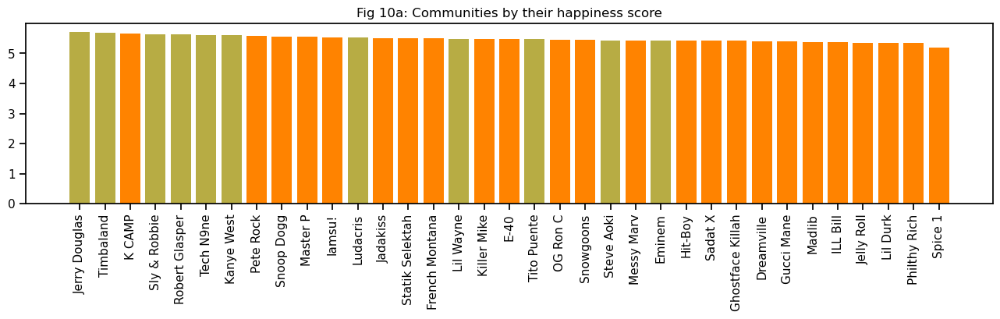

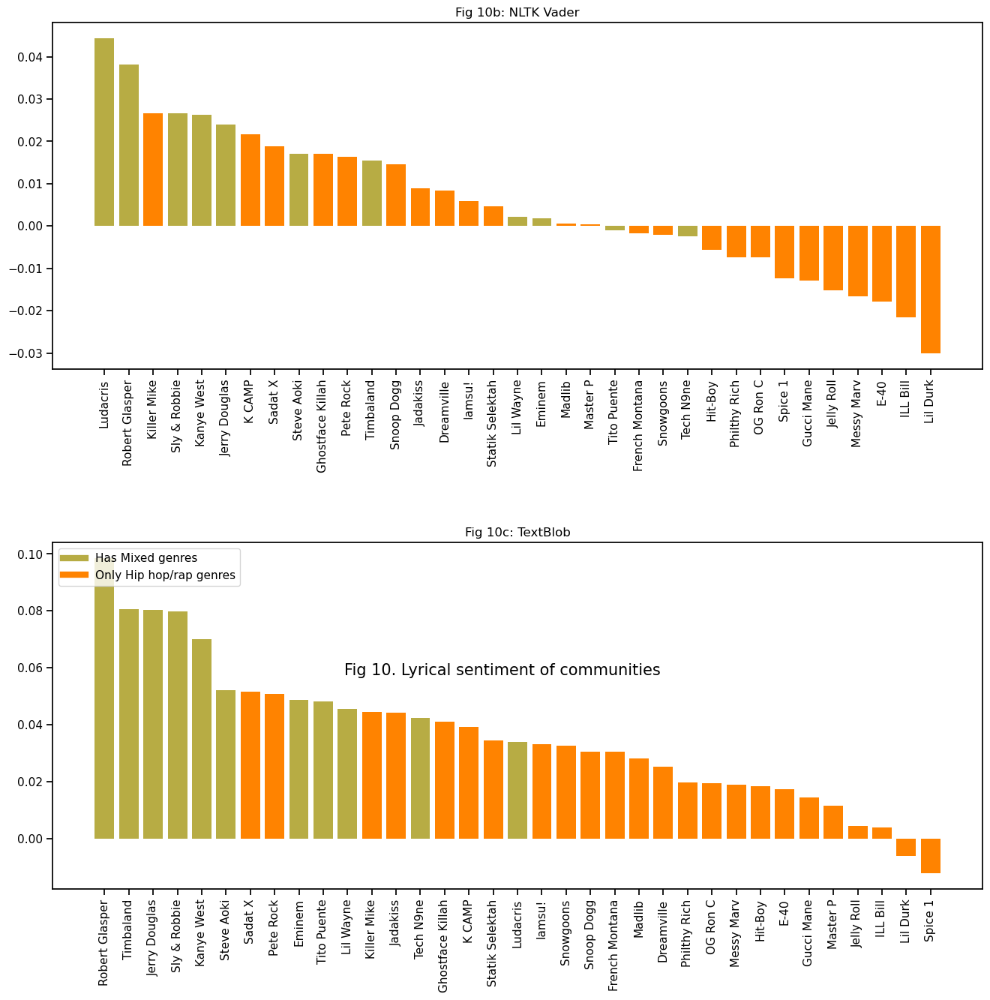

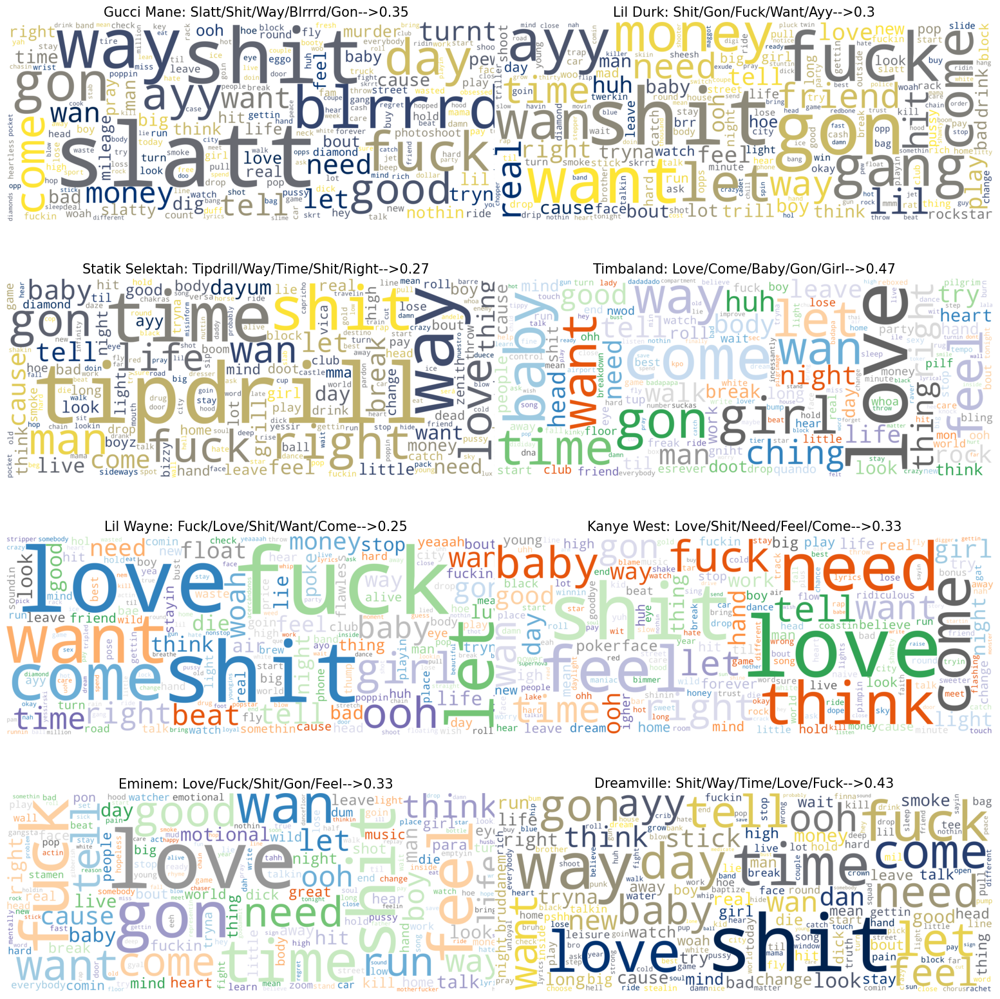

p-value:  0.0
Difference between means is significant


In [19]:
'''
Below code performs sentiment analysis using NLP modules defined previously and visualises them 
-The first part takes the lyrics and community infomation of each track as input and returns list at community ID
level and lyrics corpus. This is fed into the LabMT method of sentiment calculation.
-The lyrics are fed intO the NLTK and Textblob functions to calculate the sentiments at a track level. 
-The scores are rolled up at Community level and visualised via bar plots.
-Additionally, the lyrics TFIDF wordclouds of selected communities (four of Hip hop dominant and mixed genre each)
were visualised.
-Permutation test is performed to check if the happiness scores of Hip hop dominant and
mixed genres come from the same distribution or not.
'''
master_comm_lyrics = read_texts(partition_artists_df, collabsong_df_final, 'CommunityID', 'Lyrics') #reading and cleaning up texts
commwise_hapscore = happiness_sentiment(master_comm_lyrics)
commwise_hapscore_df = pd.DataFrame(commwise_hapscore,columns=['CommunityID','Happiness_Score'])
#merging central artist information 
commwise_hapscore_df = commwise_hapscore_df.merge(TopInTheirComm_df,how='left',left_on='CommunityID',
                                                  right_on = 'CommunityID')

#merging community genre heterogenity flag to identify which are Hip hop dominant and which are mixed genres
commwise_hapscore_df = commwise_hapscore_df.merge(partition_artists_summarise[['CommunityID','TopGenre_hasNonHipHop']],
                                                 how='left',left_on='CommunityID',right_on='CommunityID')
commwise_hapscore_df['genre_color'] = np.where(commwise_hapscore_df['TopGenre_hasNonHipHop']=="Y","#B7AC44",'#FF8300')
    
commwise_hapscore_df.sort_values('Happiness_Score',ascending=False,inplace=True)
plt.figure(figsize=(16,3))
plt.bar(commwise_hapscore_df['ArtistName'],commwise_hapscore_df['Happiness_Score'],
        color=list(commwise_hapscore_df['genre_color']))
plt.xticks(rotation=90,ha='center')
plt.title("Fig 10a: Communities by their happiness score")
plt.show()

'''Code calculates the NLTK sentiment based on the lyrics'''

collabsong_df_final[['nltk_pos_score','nltk_neg_score']] = collabsong_df_final[['Lyrics']].apply(sentiment_nltk,axis=1)

'''Code calculates the Textblob sentiment based on the lyrics'''
collabsong_df_final['textblob_score'] = collabsong_df_final['Lyrics'].apply(sentiment_textblob)

collabsong_df_final['nltk_finalscore'] = collabsong_df_final['nltk_pos_score']-collabsong_df_final['nltk_neg_score']
nltk_textblob_sent_mean = collabsong_df_final.groupby('CommunityID').mean()
nltk_textblob_sent_mean = nltk_textblob_sent_mean.merge(partition_artists_summarise[['CommunityID','TopGenre_hasNonHipHop']],
                                                 how='left',left_on='CommunityID',right_on='CommunityID')
nltk_textblob_sent_mean['genre_color'] = np.where(nltk_textblob_sent_mean['TopGenre_hasNonHipHop']=="Y","#B7AC44",'#FF8300')
nltk_textblob_sent_mean.reset_index(inplace=True)
nltk_textblob_sent_mean = nltk_textblob_sent_mean.merge(TopInTheirComm_df,how='left',left_on='CommunityID',right_on='CommunityID')
nltk_textblob_sent_mean.rename(columns={'ArtistName':'CentralArtist'},inplace=True)
nltk_textblob_sent_mean.sort_values('nltk_finalscore',ascending=False, inplace=True)
fig,axs = plt.subplots(2,1,figsize=(16,15))
axs[0].bar(nltk_textblob_sent_mean['CentralArtist'],nltk_textblob_sent_mean['nltk_finalscore'], color=list(nltk_textblob_sent_mean['genre_color']))
axs[0].set_title("Fig 10b: NLTK Vader")
axs[0].tick_params(axis='x',labelrotation=90)

nltk_textblob_sent_mean.sort_values('textblob_score',ascending=False, inplace=True)
axs[1].bar(nltk_textblob_sent_mean['CentralArtist'],nltk_textblob_sent_mean['textblob_score'],color=list(nltk_textblob_sent_mean['genre_color']))
axs[1].tick_params(axis='x',labelrotation=90)
axs[1].set_title("Fig 10c: TextBlob")
plt.subplots_adjust(hspace=0.5)
legend_elements = [Line2D([0], [0], lw=6,color = "#B7AC44",label="Has Mixed genres"),
                   Line2D([0], [0], lw=6, color = "#FF8300",label="Only Hip hop/rap genres")]
plt.legend(handles=legend_elements,loc='upper left')
plt.savefig('Figure10_SentimentOfCommunities.png', dpi=500)
plt.figtext(0.5,0.3,"Fig 10. Lyrical sentiment of communities",ha='center',fontsize=15)
plt.show()

tf_idf_counter_artists = tfidf_wordcloud(master_comm_lyrics, 4,2,"Louvain",'ArtistName',5,1) #TDIDF and subsequent wordclouds

NonHipHop = list(nltk_textblob_sent_mean[nltk_textblob_sent_mean['TopGenre_hasNonHipHop']=='Y']['textblob_score'])
OnlyHipHop = list(nltk_textblob_sent_mean[nltk_textblob_sent_mean['TopGenre_hasNonHipHop']=='N']['textblob_score'])

'''Permutation test for difference in happiness score significance'''

from mlxtend.evaluate import permutation_test
p_value = permutation_test(NonHipHop, OnlyHipHop,
                           method='approximate',
                           num_rounds=10000,
                           seed=0)

print("p-value: ",np.round(p_value,3))
if p_value < 0.05:
    print("Difference between means is significant")
else:
    print("Different between means fails to be proven significant")

**Figure 10** subplots show a clear trend that the collaborations across mixed genres have a more positive sentiment than the communities with rap-only artists collaborations. Comparing methods, the happiness score based on LabMT file offers the least reliable insight although it score the artist in almost the same way and therefore the ranking seems unreliable. NLTK Vader and Text Blob sentiment values have a lot more variance and the order of artists is almost the same. It is difficult to say why the results of textblob and Vader are different as Textblob is based on the NLTK corpora as its base; there is a possibility of the difference being non-consequential. [see](https://www.researchgate.net/profile/Janardhan-Naulegari/publication/333602124_A_Comprehensive_Study_on_Lexicon_Based_Approaches_for_Sentiment_Analysis/links/5d13452ca6fdcc2462a688ed/A-Comprehensive-Study-on-Lexicon-Based-Approaches-for-Sentiment-Analysis.pdf). In order to be more confident about the conclusions, the communities were bifurcated into Hip hop only and mixed genere communities and their average sentiment scores were passed through a permutation or randomisation test. This is to check the null hypothesis that the sentiment scores of both these categories come from the same distribution. The test shows that the difference between the distributions is significant at $\alpha$ value < 0.05 and therefore the null hypothesis is rejected thus substantiating the difference between sentiment scores of the two classes.
The word clouds of some select communities are shown below with the mixed genre communities color coded with a brighter color scheme. One cannot help notice that the Hip hop dominant communities are more prone to cursing. On the other hand,  three out of four mixed genre communities have "love" in their top 5 words with highest tfidf score and just one out of the four hip hop only communities has love in the top tfidf words. The tfidf word clouds are however not conclusive evidence as the tfidf values are itself very low which indicates lower exclusivity across communities. 
Another option to explore was [Flair](https://github.com/flairNLP/flair)  which is a Vector space model and therefore utilises word embeddings to capture the context of the sentences. But the author couldnt produce its results it takes more computational power. Flair offers many types of objects hence using the string based approach could have been a good idea.

The above indicates that hip hop genres are , generally, more sad, atleast lyrically and the behavior changes when they are collaborating with other genres. This further encourages the investigation of lyrics sentiment of solo artists from hip hop and other respective genres and how that compares against the sentiment of the collaborations. For this purpose, one sample community of sizeable member count is chosen. 
## Importing lyrics of solo tracks

In [34]:
'''
Following code imports the solo tracks performed by the artists and the lyrics of individual artists within a
sample community are analysed to look for any difference between the lyrics in the collaborations vs the singles.
-Solo tracks are imported and a community is selected for testing
- 4 artists each are sampled from Hip hop only and non Hip hop genre
- Sentiment scores are calculated by 3 methods and presented in a bar chart
- TFIDF wordclouds of Hip hop only and non Hip hop genre are created
'''
solotracks_df=pd.read_csv("solotracks_df.csv")

'''Selecting community with Kanye West as central figure'''
selected_community = partition_artists_summarise[partition_artists_summarise['CentralArtist']=='Kanye West']['CommunityID'].values[0]
selected_ = partition_artists_df[partition_artists_df['CommunityID']==selected_community]
selected_1 = selected_[selected_['NonRapGenre']==1].sample(n=4)
selected_2 = selected_[selected_['NonRapGenre']==0].sample(n=4)
selected_ = pd.concat([selected_1,selected_2])

#Filtering the solo tracks of the selected artists

solotracks_df_select=solotracks_df.merge(selected_[['ArtistName','NonRapGenre']],how='inner',
                              left_on='ArtistName',right_on='ArtistName')

#fetching track popularities
solotracks_df_select = solotracks_df_select.merge(popularity_list_df,how='left', left_on='TrackID',
                               right_on='TrackID')
st = time.time()
solotracks_df_select['lyrics_language'] = solotracks_df_select['Lyrics'].apply(language_detection)
et = time.time()
print("language detection time taken: ",(et-st))
solotracks_df_select = solotracks_df_select[solotracks_df_select['lyrics_language']=='en']
solotracks_df_select.drop_duplicates('TrackID',keep="first",inplace=True)
solotracks_df_select.reset_index(inplace=True)
solotracks_df_select.drop(columns=['index'],inplace=True)
print(len(solotracks_df_select))

language detection time taken:  9.916572093963623
920


master comm len:  8


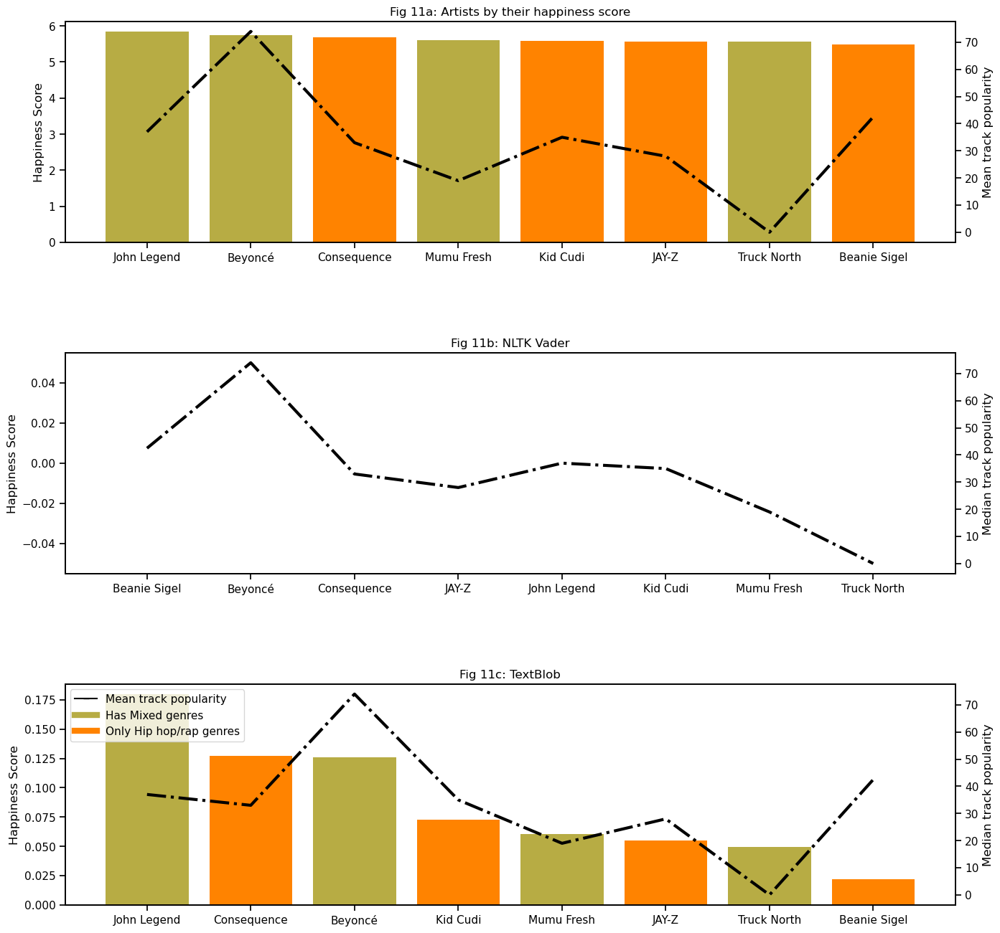

master comm len:  2


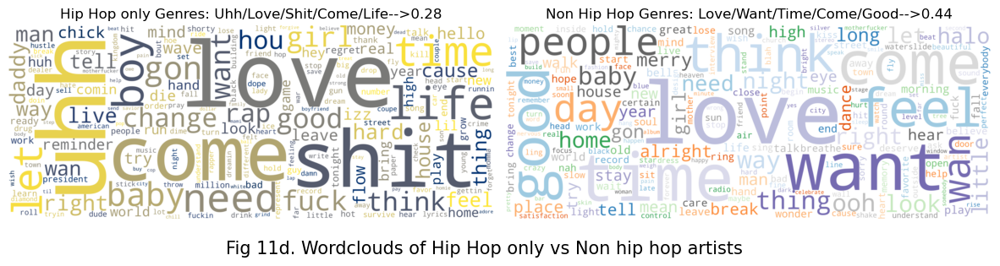

In [36]:
'''
Following code is used to read to song texts and create a list with lyrics corpus at the Artist level ( the 8 chosen
artists). The happiness score is calculated for the artists using three methods
'''
master_solo_lyrics = read_texts(selected_, solotracks_df_select, 'ArtistName', 'Lyrics') #reading and cleaning up texts
commwise_hapscore = happiness_sentiment(master_solo_lyrics)
master_solo_lyrics_df = pd.DataFrame(master_solo_lyrics,columns=['ArtistName','Happiness_Score'])
commwise_hapscore_df = pd.DataFrame(commwise_hapscore,columns=['ArtistName','Happiness_Score'])

commwise_hapscore_df = commwise_hapscore_df.merge(selected_[['ArtistName','NonRapGenre']],
                                                 how='left',left_on='ArtistName',right_on='ArtistName')
commwise_hapscore_df['genre_color'] = np.where(commwise_hapscore_df['NonRapGenre']==1,"#B7AC44",'#FF8300')
    
commwise_hapscore_df.sort_values('Happiness_Score',ascending=False,inplace=True)
interm_popularity = solotracks_df_select[['ArtistName','TrackPopularity']].groupby('ArtistName').median().reset_index()
commwise_hapscore_df = commwise_hapscore_df.merge(interm_popularity,how='left',left_on='ArtistName',right_on='ArtistName')
fig,axs = plt.subplots(3,1,figsize=(16,16))
axs[0].bar(commwise_hapscore_df['ArtistName'],commwise_hapscore_df['Happiness_Score'],
        color=list(commwise_hapscore_df['genre_color']))
axs2 = axs[0].twinx()
axs2.plot(commwise_hapscore_df['ArtistName'],commwise_hapscore_df['TrackPopularity'],color='black',lw=3,linestyle='dashdot')
axs[0].set_ylabel("Happiness Score")
axs2.set_ylabel("Mean track popularity")
axs[0].set_title("Fig 11a: Artists by their happiness score")

#applying NLTK Vader and Text Blob sentiment functions
solotracks_df_select[['nltk_pos_score','nltk_neg_score']] = solotracks_df_select[['Lyrics']].apply(sentiment_nltk,axis=1)
solotracks_df_select['textblob_score'] = solotracks_df_select['Lyrics'].apply(sentiment_textblob)

solotracks_df_select['nltk_finalscore'] = solotracks_df_select['nltk_pos_score']-solotracks_df_select['nltk_neg_score']
nltk_textblob_sent_mean = solotracks_df_select.groupby('ArtistName').median()
nltk_textblob_sent_mean['genre_color'] = np.where(nltk_textblob_sent_mean['NonRapGenre']==1,"#B7AC44",'#FF8300')
nltk_textblob_sent_mean.reset_index(inplace=True)
nltk_textblob_sent_mean.sort_values('nltk_finalscore',ascending=False, inplace=True)

#Making the bar plot for NLTK Score
axs2=axs[1].twinx()
axs[1].bar(nltk_textblob_sent_mean['ArtistName'],nltk_textblob_sent_mean['nltk_finalscore'], color=list(nltk_textblob_sent_mean['genre_color']))
axs2.plot(nltk_textblob_sent_mean['ArtistName'],nltk_textblob_sent_mean['TrackPopularity'],color='black',lw=3,linestyle='dashdot')
axs[1].set_title("Fig 11b: NLTK Vader")
axs[1].set_ylabel("Happiness Score")
axs2.set_ylabel("Median track popularity")

#Making the bar plot for Textblob
nltk_textblob_sent_mean.sort_values('textblob_score',ascending=False, inplace=True)
axs2=axs[2].twinx()
axs[2].bar(nltk_textblob_sent_mean['ArtistName'],nltk_textblob_sent_mean['textblob_score'],color=list(nltk_textblob_sent_mean['genre_color']))
axs2.plot(nltk_textblob_sent_mean['ArtistName'],nltk_textblob_sent_mean['TrackPopularity'],color='black',lw=3,linestyle='dashdot')
axs[2].set_ylabel("Happiness Score")
axs2.set_ylabel("Median track popularity")
axs[2].set_title("Fig 11c: TextBlob")
plt.subplots_adjust(hspace=0.5)
legend_elements = [Line2D([0], [0], marker='_', color = 'black',markerfacecolor="black",linestyle='-',label="Mean track popularity"),
                   Line2D([0], [0], lw=6,color = "#B7AC44",label="Has Mixed genres"),
                   Line2D([0], [0], lw=6, color = "#FF8300",label="Only Hip hop/rap genres")]
plt.legend(handles=legend_elements,loc='upper left')
plt.savefig('Figure11_SentimentOfArtists.png', dpi=500)
plt.show()

# Creating TFIDF vector for the two genre (Hip hop vs Non Hip hop classification )

master_twogenretype_lyrics = read_texts(selected_, solotracks_df_select, 'NonRapGenre', 'Lyrics') #reading and cleaning up texts
vectorizer = TfidfVectorizer() #method used to create TFIDF values
twogen_lyrics = []
for m in master_twogenretype_lyrics:
    twogen_lyrics.append(m[1])
corpus = twogen_lyrics # full text corpus 
vecs=vectorizer.fit_transform(corpus) # creating TFIDF matrix (row: community, column : token)
feature_names =vectorizer.get_feature_names_out() #tokens
df_tfidfvect = pd.DataFrame(data = vecs.toarray(),columns = feature_names) #creating dataframe
df_tfidfvect_T = df_tfidfvect.T # each column is now one community
df_tfidfvect_T = df_tfidfvect_T.reset_index() #getting the tokens as a column
df_tfidfvect_T.rename(columns={'index':"token"},inplace=True)
fig, axs = plt.subplots(1,2,figsize=(15,8))
plt.axis('off')
axs = axs.flatten()
chosen_communities = [0,1]
for i in range(len(chosen_communities)):
    _num  =chosen_communities[i]
    if len(master_twogenretype_lyrics[_num][1]) >0 :
        #to get the top 5 words in the TF-IDF vector
        tf_idf_counter = dict(zip(df_tfidfvect_T['token'],df_tfidfvect_T[_num])) #dict of token TFIDF per community
        tf_idf_counter_sorted = dict(sorted(tf_idf_counter.items(), key=lambda item: item[1], reverse=True)) #sorting dictionary in desc order
        firstN = [n for n in tf_idf_counter_sorted.items()][:5] #top 5 words by TFIDF value for subplot title
        if _num == 1:
        #creating the plot header for non Hip hop genre
            plot_header = "Non Hip Hop Genres: "
            c = 0
            for key, value in firstN:
                if c == 0:
                    plot_header= plot_header+key.title()
                else:
                    plot_header= plot_header+"/"+key.title() #appending words separated by "/""
                c +=1
            # plot header to have top 5 words by TFIDF in the community followed by the Max TFIDF in that community
            plot_header = plot_header+"-->"+str(np.round(np.max(df_tfidfvect_T[_num]),2))
            fig_wordcloud =wordcloud.WordCloud(width = 5000, height = 2000,background_color='white', collocations=False,
                                           colormap = 'tab20c')
        #creating the plot header for Hip hop dominant genre
        else:
            plot_header = "Hip Hop only Genres: "
            c = 0
            for key, value in firstN:
                if c == 0:
                    plot_header= plot_header+key.title()
                else:
                    plot_header= plot_header+"/"+key.title() #appending words separated by "/""
                c +=1
            # plot header to have top 5 words by TFIDF in the community followed by the Max TFIDF in that community
            plot_header = plot_header+"-->"+str(np.round(np.max(df_tfidfvect_T[_num]),2))
            fig_wordcloud =wordcloud.WordCloud(width = 5000, height = 2000,background_color='white', collocations=False,
                                           colormap = 'cividis')


        fig_wordcloud.generate_from_frequencies(tf_idf_counter) #passing dict of token TFIDF per community
        axs[i].imshow(fig_wordcloud, interpolation='bilinear')
        axs[i].axis('off')
        axs[i].set_title(plot_header,size=12)
        i+=1

plt.subplots_adjust(wspace=0.025, hspace=None)
# plt.tight_layout(pad=-1)
plt.savefig('Figure11_SentimentOfArtists_wordcloud.png', dpi=500)
plt.figtext(0.5,0.3,"Fig 11d. Wordclouds of Hip Hop only vs Non hip hop artists",ha='center',fontsize=15)

plt.show()


In [41]:
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_components=5, max_iter=20,
                                learning_method='online',
                                learning_offset=50.)
print("lda init")
vectorizer = TfidfVectorizer() #method used to create TFIDF values
corpus = twogen_lyrics # full text corpus 
vecs=vectorizer.fit_transform(corpus) # creating TFIDF matrix (row: community, column : token)
feature_names =vectorizer.get_feature_names_out() #tokens
df_tfidfvect = pd.DataFrame(data = vecs.toarray(),columns = feature_names) #creating dataframe
df_lda_trf = lda.fit_transform(df_tfidfvect)

def print_top_words(model, feature_names, n_top_words,topic_string):
    norm = model.components_.sum(axis=1)[:, np.newaxis]
    for topic_idx, topic in enumerate(model.components_):
        topic_string = ""
        print(80 * "-")
        print("Topic {}".format(topic_idx+1))
        for i in topic.argsort()[:-n_top_words - 1:-1]:
            topic_string=topic_string+" "+feature_names[i]
        print(topic_string)

print("\nTopics in LDA model:")
counts_feature_names = vectorizer.get_feature_names_out()
n_top_words = 10

print_top_words(lda, counts_feature_names, n_top_words,topic_string)


topicnames = ["Topic" + str(i) for i in range(1,lda.n_components+1)] #topic1,topic2,.... topic5 # column names
docnames = ["Doc" + str(i) for i in range(len(df_tfidfvect))] #doc0, doc1, doc2,... # index names
df_document_topic = pd.DataFrame(np.round(df_lda_trf, 2), columns=topicnames, index=docnames) # Make the pandas dataframe

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic+1

# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_green).applymap(make_bold)
df_document_topics

lda init

Topics in LDA model:
--------------------------------------------------------------------------------
Topic 1
 skeet absurdity grant love ambiance honeydew coming garment crowd glimpse
--------------------------------------------------------------------------------
Topic 2
 teeth verily rehearsin popular snub price undeveloped fix conductor cost
--------------------------------------------------------------------------------
Topic 3
 dwell scarcely rarely yea spouse strippin let bury creature ordinary
--------------------------------------------------------------------------------
Topic 4
 crib illuminate deter expire honesty triple goin piano roundball noontide
--------------------------------------------------------------------------------
Topic 5
 stopper grandmother late showy classify bob narcoleptic slide torch smelling


,Topic1,Topic2,Topic3,Topic4,Topic5,dominant_topic
Doc0,0.970000,0.010000,0.010000,0.010000,0.010000,1
Doc1,0.960000,0.010000,0.010000,0.010000,0.010000,1


Figure 11 shows the average sentiment value of the chosen artists (four non hip hop and four hip hop only artists) from the community. More specifically, the sentiment for each artist is calculated based on their solo tracks. Each of these plots( 11(a),11(b),11(c)) also show the mean track popularity values to give an idea of how the listeners take to the tonality of their lyrics. It can be clearly seen that the non hip hop artists have a higher average popularity. The wordclouds further cement the observation.The non Hip hop word cloud have happier words such as dance, love, time, baby, girl i.e. about the lighter aspects of life. The latter, appear to be curse and have words bad, hard etc. There are many words common between the wordclouds; however the curses and the mention of material elements and sadder adjectives render the Hip hop genre wordcloud a grim or realistic tone (than a dreamy tone). This shows a distinction between the lyric styles of Hip hop210
artists and non Hip hop artists. \
Another method explored is Latent Dirichlet Allocation which is a probabilistic unsupervised method for topic modelling in a corpus. Each document is a collection of words and one document can be discussing multiple topics.The LDA calculates the probability that the words belong to a topic. The probability for a word $w$ to belong to a topic is calculated: \
                     `p(word w with topic t) = p(topic t | document d) * p(word w | topic t)`
The results from LDA aren't very promising as this is an unsupervised setting and getting the right combination of number of components, number of iterations and learning offset can be time consuming. Further, there is evidence that LDA fails to perform when the text is short [Chauhan et al](https://dl.acm.org/doi/pdf/10.1145/3462478) and when one word can have multiple meanings [LDA Limitation](https://stats.stackexchange.com/questions/164621/limitation-of-lda-latent-dirichlet-allocation) [LDA Limitation2](https://www.georgeho.org/lda-sucks/#:~:text=tl%3Bdr%3A%20LDA%20and%20topic,coherently%20discuss%20a%20single%20topic.)

In [ ]:
'''
Following three cells of code calculate Textblob median sentiment at 3 levels:
- Community level
- Solo tracks of the Hip hop only artists
- Solo tracks of the non Hip hop artists
Below code imports the lyrics of solo tracks , drops the non english lyrics and calculatest the Text Blob sentiment
at song level
'''
solotracks_df=pd.read_csv("solotracks_df.csv")
solotracks_df = solotracks_df.merge(partition_artists_df[['ArtistName','CommunityID','NonRapGenre']],how='inner', left_on='ArtistName',
                               right_on='ArtistName')
solotracks_df = solotracks_df.merge(popularity_list_df,how='left', left_on='TrackID',
                               right_on='TrackID')
solotracks_df['lyrics_language'] = solotracks_df['Lyrics'].apply(language_detection)
solotracks_df = solotracks_df[solotracks_df['lyrics_language']=='en']
solotracks_df['textblob_score'] = solotracks_df['Lyrics'].apply(sentiment_textblob)

In [47]:
#Calculating Median sentiment at Community ID level
nltk_textblob_sent_mean = collabsong_df_final.groupby('CommunityID').median()
nltk_textblob_sent_mean.reset_index(inplace=True)
nltk_textblob_sent_mean.rename(columns={'textblob_score':'textblob_score_collab','TrackPopularity':'TrackPopularity_collab'},inplace=True)

In [93]:
# Reshaping the sentiment data and arranging as seen below:
pivot_sentiment = solotracks_df[['textblob_score','CommunityID','NonRapGenre','TrackPopularity']].groupby(['CommunityID','NonRapGenre']).median()
pivot_sentiment = pivot_sentiment.reset_index()
pivot_sentiment = pd.pivot_table(pivot_sentiment,index='CommunityID',columns=['NonRapGenre'],values=['textblob_score','TrackPopularity'])
pivot_sentiment = pivot_sentiment.reset_index()
pivot_sentiment.columns=['CommunityID','HipHopOnlyPopularity','NonHipHopPopularity','HipHopOnlyHapScore','NonHipHopScore']
pivot_sentiment = pivot_sentiment.merge(nltk_textblob_sent_mean[['CommunityID','textblob_score_collab','TrackPopularity_collab']],
                                       how='left',left_on='CommunityID',right_on='CommunityID')
pivot_sentiment.sort_values(by='textblob_score_collab',ascending=False, inplace=True)
pivot_sentiment.head()

,CommunityID,HipHopOnlyPopularity,NonHipHopPopularity,HipHopOnlyHapScore,NonHipHopScore,textblob_score_collab,TrackPopularity_collab
30,30,10.0,8.0,0.047515,0.115674,0.089457,10.0
14,14,NaN,2.0,NaN,0.081214,0.081214,1.0
21,21,5.0,28.0,0.078667,0.143424,0.068469,9.0
3,3,8.0,3.0,0.094081,0.094213,0.067908,7.0
25,25,20.0,36.0,0.065073,0.148565,0.065931,20.0


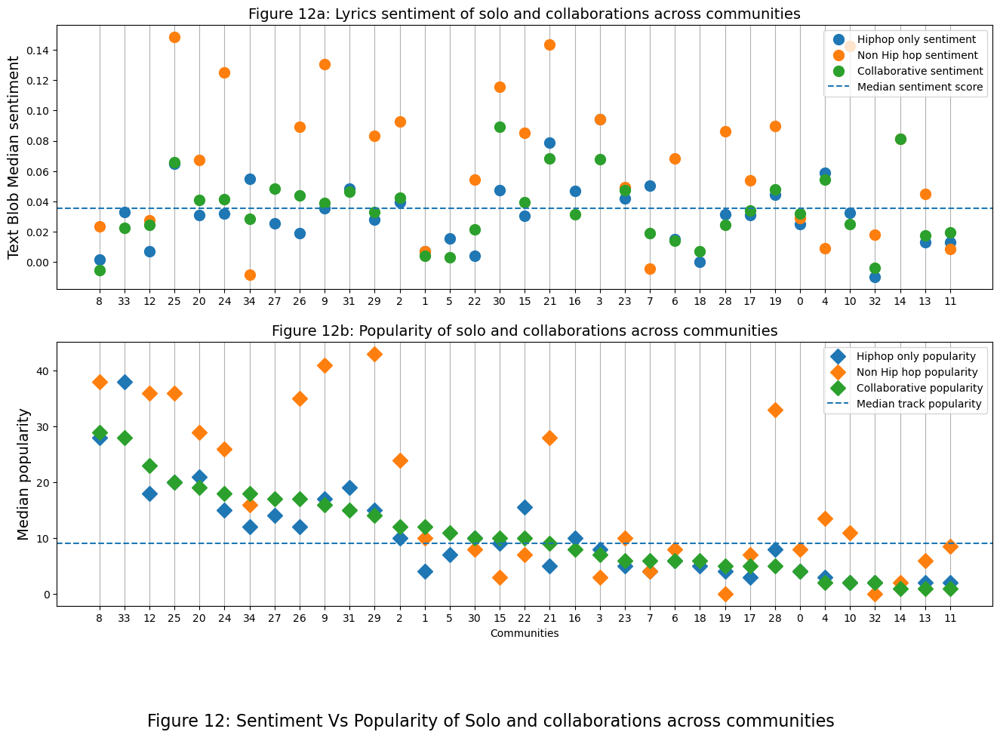

In [98]:
# Producing the plots
import matplotlib
matplotlib.rc_file_defaults()
fig,axs = plt.subplots(2,1,figsize=(16,10))
axs=axs.flatten()
axs[0].plot(pivot_sentiment['CommunityID'].astype(str),pivot_sentiment['HipHopOnlyHapScore'],lw=0, marker='o',markersize=10,label='Hiphop only sentiment')
axs[0].plot(pivot_sentiment['CommunityID'].astype(str),pivot_sentiment['NonHipHopScore'],lw=0, marker='o',markersize=10,label='Non Hip hop sentiment')
axs[0].plot(pivot_sentiment['CommunityID'].astype(str),pivot_sentiment['textblob_score_collab'], lw=0, marker='o',markersize=10,label='Collaborative sentiment')
axs[0].axhline(y=np.median( solotracks_df['textblob_score']),linestyle='--',label="Median sentiment score")
axs[0].grid(axis='x')
axs[0].set_ylabel("Text Blob Median sentiment",fontsize=14)
axs[0].set_title("Figure 12a: Lyrics sentiment of solo and collaborations across communities",fontsize=14)
axs[0].legend(loc='upper right')
pivot_sentiment.sort_values(by='TrackPopularity_collab',ascending=False, inplace=True)
axs[1].plot(pivot_sentiment['CommunityID'].astype(str),pivot_sentiment['HipHopOnlyPopularity'],lw=0, marker='D',markersize=10,label='Hiphop only popularity')
axs[1].plot(pivot_sentiment['CommunityID'].astype(str),pivot_sentiment['NonHipHopPopularity'],lw=0, marker='D',markersize=10,label='Non Hip hop popularity')
axs[1].plot(pivot_sentiment['CommunityID'].astype(str),pivot_sentiment['TrackPopularity_collab'], lw=0, marker='D',markersize=10,label='Collaborative popularity')
axs[1].axhline(y=np.nanmedian( solotracks_df['TrackPopularity']),linestyle='--',label="Median track popularity")
axs[1].grid(axis='x')
axs[1].set_ylabel("Median popularity",fontsize=14)
axs[1].set_xlabel("Communities")
axs[1].set_title("Figure 12b: Popularity of solo and collaborations across communities",fontsize=14)
axs[1].legend(loc='upper right')
plt.savefig('Figure12_SingleVsVarious.png', dpi=500)
plt.figtext(0.2,-0.05,"Figure 12: Sentiment Vs Popularity of Solo and collaborations across communities",fontsize=16)
plt.show()

Figure 12(a) puts the lyrics sentiment of songs sung by hip hop artists vs the other artists and their collaborations for each community in perspective. The plot is sorted in descending order of sentiment of the collaborations. Non Hip hop genre sentiments are mostly way above the median sentiment reference line barring a few exceptions whereas the sentiment of the Hip hop only artists closely follows the sentiment of collaborations,however having slightly higher sentiment.On close observation, it can be seen that both the solo trends have a negative slope therefore varying directly with the collaboration sentiment. This could mean that the artists with similar lyrical tonalities prefer collaborating. Figure 12(b) captures the same categories for the measure of median popularity. In the left half of the graph the songs of non Hip hop artists have very high popularity compared to the Hip hop solos and collaborations but the formers begin to come in the range of the other two categories in the right half of the graph. If popularity were any motivation for artists to choose their collaborators, it seems that in the communities in the left half, the Hip hop artists benefited more from the collaboration that their counterparts. In some communities in the middle, the non Hip hop artists may have gained more popularity by collaborating with their Hip hop counterparts. 
The above observation wont hold if the any of the solo popularities seen here are already impacted by the success of the collaborations, which means that the levels of popularity of the solo artists could be lower or higher than what is seen here before the collaborations. It is to be remembered that the popularity of a track is a product of the quality of the song as perceived by the audience and also the reach of the song. \
The next step was to analyze the audio features of the songs as there is more to the mood of a song and its reception than just the lyrics ( considering the immense success international music has received in recent times). At first, histograms are created to check the data distribution followed by correlation plots for any possible variable redundancy.
## Audio Features

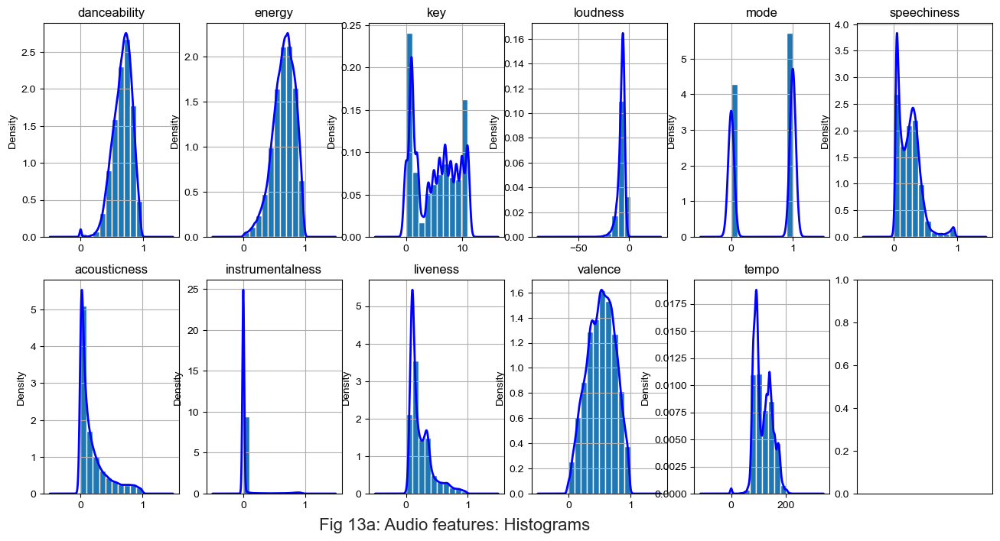

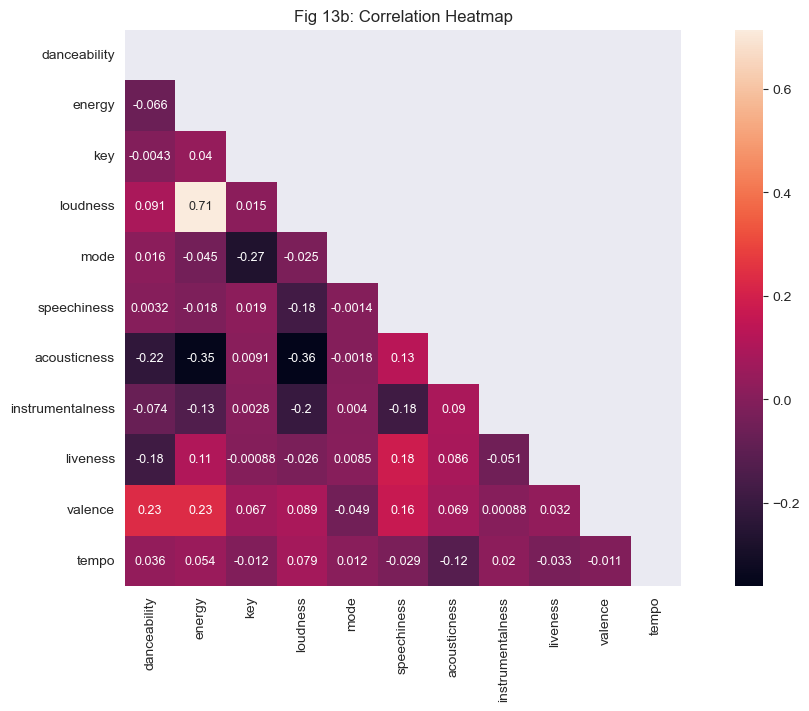

In [115]:
'''importing data related to audio features of the tracks'''
audio_features = pd.read_csv("audio_features.csv")
# audio_features_p2 = pd.read_csv("audio_features_df_p2.csv")
solo_1 = pd.read_csv("artist_solosongs_df_p1.csv")
# solo_2 = pd.read_csv("artist_solosongs_df_p2.csv")
solosong_df = pd.concat([solo_1,solo_2])
audio_features = pd.concat([audio_features_p1,audio_features_p2])
audio_features.drop(columns=['Unnamed: 0'],inplace=True)
audio_features.drop_duplicates("songid", keep='first',inplace=True)
audio_features.rename(columns={'songid':'TrackID'},inplace=True)
audio_features = audio_features.merge(artist_album_tracks_df[['TrackID','ArtistName']],how='inner',left_on='TrackID',
                                      right_on='TrackID')
audio_features = audio_features.merge(partition_artists_df[['ArtistName','CommunityID','NonRapGenre']],how='inner',left_on='ArtistName',
                                      right_on='ArtistName')
audio_1 = audio_features.merge(collabsong_df[['TrackID']],how='inner',left_on='TrackID',right_on='TrackID')
audio_1['SoloFlag'] = 'N'
audio_2 = audio_features.merge(solosong_df[['TrackID']],how='inner',left_on='TrackID',right_on='TrackID')
audio_2['SoloFlag'] = 'Y'
audio_features = pd.concat([audio_1,audio_2])
audio_features.drop_duplicates("TrackID", keep='first',inplace=True)

audio_features= audio_features.merge(TopInTheirComm_df[['ArtistName','CommunityID']],how='inner',
                                      left_on='CommunityID',right_on='CommunityID')

audio_features.rename(columns={'ArtistName_x':'ArtistName','ArtistName_y':'CentralArtist'},inplace=True)
audio_features= audio_features.merge(partition_artists_summarise[['TopGenre_hasNonHipHop','CommunityID']],how='inner',
                                      left_on='CommunityID',right_on='CommunityID')
corrMatrix =audio_features[['danceability','energy','key','loudness','mode','speechiness',
                'acousticness','instrumentalness','liveness','valence','tempo']].corr()

audio_attr_list = ['danceability','energy','key','loudness','mode','speechiness',
                'acousticness','instrumentalness','liveness','valence','tempo']

#Making histograms of the audio features
from scipy import stats
fig,axs = plt.subplots(2,6,figsize=(16,8))
sns.set_style("darkgrid")
axs = axs.flatten()
plt.figtext(0.35,0.05,"Fig 13a: Audio features: Histograms",fontsize=16)

for i in range(len(audio_attr_list)):
    axs[i].hist(audio_features[audio_attr_list[i]])
    axs[i].set_title(audio_attr_list[i])
    audio_features[audio_attr_list[i]].plot.kde(ax=axs[i],color='blue',lw=2)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) 
plt.show()


import seaborn as sns
from scipy import stats
fig, axs = plt.subplots(constrained_layout=True,figsize=(12,7))

axs.set_title('Fig 13b: Correlation Heatmap',loc='center')
sns.axes_style("whitegrid")
mask = np.zeros_like(corrMatrix)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corrMatrix,mask = mask,annot=True, annot_kws={"fontsize":9},square=True,ax=axs)
plt.savefig('Figure13_audio_correlation_heatmap.png', dpi=500)
plt.show()
'''calculating mean values for audio features with genre class color mapping'''
audio_features_collab = audio_features[audio_features['SoloFlag']!='Y']
mean_audio_collab = audio_features_collab[['CommunityID','CentralArtist','TopGenre_hasNonHipHop','danceability','energy','key','loudness','mode','speechiness','acousticness','instrumentalness','liveness','valence','tempo']].groupby(['CommunityID','CentralArtist','TopGenre_hasNonHipHop']).median()
mean_audio_collab = mean_audio_collab.reset_index()
mean_audio_collab['genre_color'] = np.where(mean_audio_collab['TopGenre_hasNonHipHop']=="Y","#B7AC44",'#FF8300')


**Figure 13** shows the histograms of the various [audio attributes](https://developer.spotify.com/documentation/web-api/reference/#/operations/get-several-audio-features). It can be seen that some of the attributes are multimodal indicating that it could be a mix of multiple distributions. At the onset, `valence` is ignored as it is Spotify's method of measuring the happiness of the track which could be a combination of both lyrics and audio features that no information is available about it.`Instrumentalness` and `liveness` are not relevant for this study and mode has very low variance. From Figure 13b it can be seen that `loudness` and `energy` are high correlated therefore only one can be analysed for any patterns. The remaining attributes are analysed community wise for any difference in patterns between the collaborations, the solo tracks of the Hip hop artists and those of the non Hip hop artists.

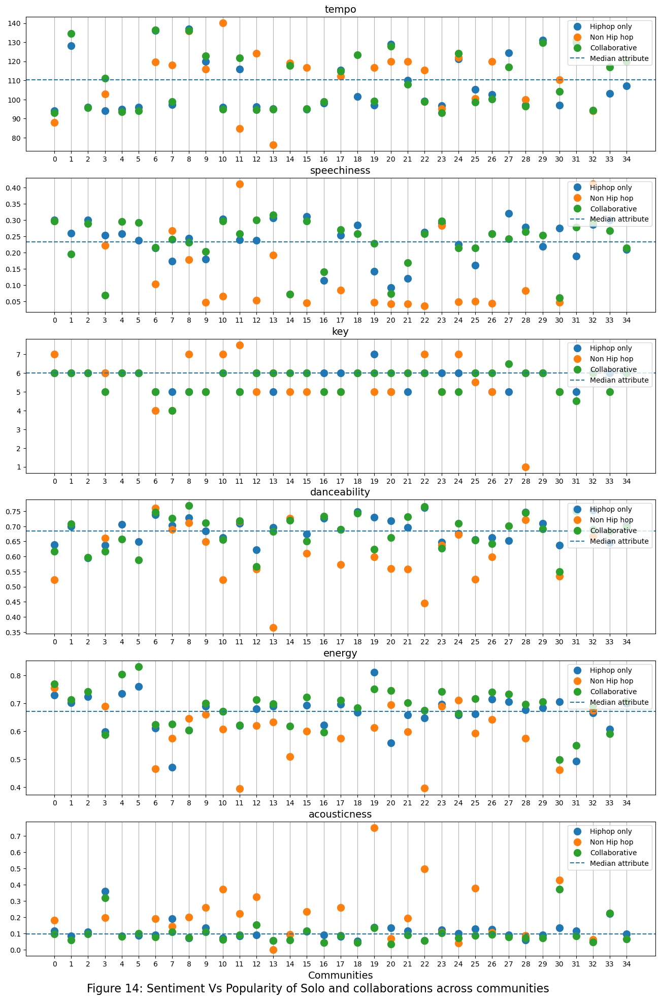

In [122]:
import matplotlib
matplotlib.rc_file_defaults()
'''Audio features of collaborations'''
audio_features_collab = audio_features[audio_features['SoloFlag']=='N']
audio_features_collab = audio_features_collab[['CommunityID','danceability','energy','key','loudness','mode','speechiness',
                'acousticness','instrumentalness','liveness','valence','tempo']].groupby(['CommunityID']).median()
audio_features_collab.reset_index(inplace=True)
audio_features_collab

'''Audio features of solo songs'''

attr = ['tempo','speechiness','key','danceability','energy','acousticness',]

audio_features_solo = audio_features[audio_features['SoloFlag']=='Y']
audio_features_solo = audio_features_solo[['CommunityID','NonRapGenre','danceability','energy','key','loudness','mode','speechiness',
                'acousticness','instrumentalness','liveness','valence','tempo']].groupby(['CommunityID','NonRapGenre']).median()
audio_features_solo.reset_index(inplace=True)

fig,axs = plt.subplots(6,1,figsize=(16,24))
axs=axs.flatten()
for i in range(len(attr)):
    audio_features_solo_inter = pd.pivot_table(audio_features_solo,index='CommunityID',columns=['NonRapGenre'],values=[attr[i]])
    audio_features_solo_inter.reset_index(inplace=True)
    audio_features_solo_inter.columns= ['CommunityID','HipHop only','Mixed genre']
    audio_features_solo_inter = audio_features_solo_inter.merge(audio_features_collab,how='inner',left_on='CommunityID',
                                                               right_on='CommunityID')

    axs[i].plot(audio_features_solo_inter['CommunityID'].astype(str),audio_features_solo_inter['HipHop only'],lw=0, marker='o',markersize=10,label='Hiphop only')
    axs[i].plot(audio_features_solo_inter['CommunityID'].astype(str),audio_features_solo_inter['Mixed genre'],lw=0, marker='o',markersize=10,label='Non Hip hop')
    axs[i].plot(audio_features_solo_inter['CommunityID'].astype(str),audio_features_solo_inter[attr[i]], lw=0, marker='o',markersize=10,label='Collaborative')
    axs[i].axhline(y=np.median( audio_features[attr[i]]),linestyle='--',label="Median attribute")
    axs[i].grid(axis='x')
    if i== 5:
        axs[i].set_xlabel("Communities",fontsize=14)
    axs[i].set_title(attr[i],fontsize=14)
    axs[i].legend(loc='upper right')

plt.savefig('Figure14_SingleVsVarious.png', dpi=500)
plt.figtext(0.2,0.08,"Figure 14: Sentiment Vs Popularity of Solo and collaborations across communities",fontsize=16)
plt.show()


**Figure 14** shows that the collaborations have lower tempo compared to the non hip hop songs and therefore follow the beats frequency of the hip hop artists. This falls in line with the trend observed with speechiness (lower tempo allows for rapping) where the collaborations are as verbose as the hip hop artists and are way higher than the non hip hop counterparts. The danceability of collaborations are higher than non hip hop artist solos and follow that of hip hop solos as the genre is also immense popular as a dance form of the [same name](https://en.wikipedia.org/wiki/Hip_hop_dance). It is hard to conclude anything about key attribute as there seems to be insufficient data. Energy shows a similar pattern to danceability although no linear relationship(correlation) was observed.Finally, acousticness seems to be higher for the non hip hop solos and that for the collaborations and the hip hop solos are in line. This makes sense as raps are mostly about beats and other genres are more about melody although some new age rappers are changing that [acoustic guitar in rap](https://www.fuelrocks.com/how-to-create-interesting-hip-hop-sounds-on-acoustic-guitar/#:~:text=Hip%2Dhop%20Song%20With%20Acoustic,their%20music%20to%20great%20effect). \
Thus, a collaboration between Hip hop and non Hip hop artists is mostly likely to be aligned with the style of music of the Hip hop artist with the chorus coming from the non Hip hop artist.

## Conclusion
The music artists collaboration network follows a heavy tailed degree distribution but not necessarily a scale free network as music collaborations have physical limitations and therefore cannot be scale free. Friendship Paradox that is found to exist does not imply popularity (as may be native to intuition) but suggests the working style of the Hip hop artists. The study has also found evidence of assortativity amongst the artists. The popular artists are more likely to collaborate with other popular artists and that could be motivated by an incentive of success on the music charts. Further, two major styles of lyrics have emerged, one that is from the house of Hip hop and is characterised by darker elements manifested through curses and negative connotations. The other house is that of Pop music which is the second biggest genre collaborating in music. The sentiment conveyed through lyrics is more about love, relationships and at times have a sad undertone but continue to have a far happier sentiment compared to the hip hop counterparts. The collaborations between the hip hop artists and their counterparts from other genres borrow the lyrical style from the hip hop artists. As rap artists are bound to be verbose, they command the lion's share of the words spoken in the song and therefore determine the sentiment lyrically. However, it is interesting that lyrics are losing relevance and the audio attributes determine the mood of the song. The acousticness of the collaborations are borrowed from the non Hip hop styles whereas the other attributes such as speechiness, tempo, danceability are borrowed from the Hip hop genre. 
## Assumptions
It is assumed that the data sourced from Spotify via the API is comprehensive and is representative of the music collaboration network. All artists credited in the song have participated in similar capacity and therefore are equal stakeholders in the lyrics and composition. The popularity index of Spotify is representative of the artist's actual popularity amongst the masses. The use of curses and reference to crimes (or reference to acts that are often related to it) imply a negative tonality. The sub variants of Hip hop are mostly region based \cite{TypesOfRap} and are largely similar in lyrics and composition. The backbone sampling method is able to produce a downsized version of the super-network that does not contrast with any patterns that would have otherwise been observed while studying the super-network itself.
## Future directions
An important aspect of music is how the song is split between the participant artists during a collaboration. The role of each type of artists would be better understood if the chorus and raps were analysed separately. As Hip hop and Pop were the pre dominant genres in the collaboration network, the dynamics of Hip hop and other genres may have been neglected which could be different from the results obtained in this study. Additionally, the speed of rap delivery could also play a role in defining the sentiment of the song, which nowadays is far beyond the lyrics. Additionally, word embeddings- based NLP models could be used to identify the topics in order to tag the songs. The song tags, along with technical details of the music composition could be useful to predict the popularity. Additionally, it would be interesting to study the halo effect collaborations have on the popularity of an artist by compared the artist's popularity before, during and after the release of the collaborated music and the duration of the halo effect.